In [ ]:
# Clone the repository
!git clone https://github.com/hiive/mlrose.git
%cd mlrose

# Fetch all pull requests
!git fetch origin pull/22/head:fix-joblib-issue

# Checkout the specific pull request
!git checkout fix-joblib-issue

# Install the package from the local clone with the applied fix
!pip install .

# Return to the original directory if needed
%cd ..


Cloning into 'mlrose'...
remote: Enumerating objects: 2638, done.
remote: Counting objects: 100% (428/428), done.
remote: Compressing objects: 100% (185/185), done.
remote: Total 2638 (delta 273), reused 362 (delta 243), pack-reused 2210
Receiving objects: 100% (2638/2638), 1.98 MiB | 13.05 MiB/s, done.
Resolving deltas: 100% (1849/1849), done.
/content/mlrose
From https://github.com/hiive/mlrose
 * [new ref]         refs/pull/22/head -> fix-joblib-issue
Switched to branch 'fix-joblib-issue'
Processing /content/mlrose
  Preparing metadata (setup.py) ... done
  Created wheel for mlrose-hiive: filename=mlrose_hiive-2.2.4-py3-none-any.whl size=102985 sha256=65faae7b90801c076ebb6e5562b39a729b3f8717765103df4e81b13435850f21
  Stored in directory: /tmp/pip-ephem-wheel-cache-9_6s4wru/wheels/50/ac/56/a248001dcf63344fbef992039dec2613cb4a7c56222c6f9a92
Successfully built mlrose-hiive
/content


In [ ]:
!pip install python-chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 1.9 MB/s eta 0:00:00


In [ ]:
from IPython.core.display import display, HTML # for some notebook formatting.

import mlrose_hiive
import numpy as np
import logging
import networkx as nx
import matplotlib.pyplot as plt
import string


from ast import literal_eval
import chess

from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import accuracy_score
from mlrose_hiive import QueensGenerator, MaxKColorGenerator, TSPGenerator
from mlrose_hiive import random_hill_climb, simulated_annealing, genetic_alg, mimic, FourPeaks, TravellingSales, Queens
from mlrose_hiive import ExpDecay, GeomDecay, ArithDecay, DiscreteOpt, SARunner, GARunner, RHCRunner, MIMICRunner, NNGSRunner
#from mlrose_hiive.fitness import FourPeaks, QueensGenerator
import time
import random

# switch off the chatter
logging.basicConfig(level=logging.WARNING)

In [ ]:
np.random.seed(80)
random.seed(9)
iterations = 1200

In [ ]:
#import mlrose_hiive
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# Define the 8-Queens problem
fitness_queens = mlrose_hiive.Queens()

In [ ]:
# Define alternative N-Queens custom fitness function for maximization problem
def queens_max(state):
  # Initialize counter
  fitness_cnt = 0

  # For all pairs of queens
  for i in range(len(state) - 1):
    for j in range(i + 1, len(state)):
      # Check for horizontal, diagonal-up and diagonal-down attacks
      if (state[j] != state[i]) and (state[j] != state[i] + (j - i)) and (state[j] != state[i] - (j - i)):
        # If no attacks, then increment counter
        fitness_cnt += 1

  return fitness_cnt

# Initialize custom fitness function object
fitness_cust = mlrose_hiive.CustomFitness(queens_max)

### Solving the 8-Queens Problem Using the Randomized Hill Climbing algorithm

In [ ]:
problem_queens = mlrose_hiive.DiscreteOpt(length=8, fitness_fn=fitness_queens, maximize=True, max_val=8)

[0 0 0 0 0 0 0 0]


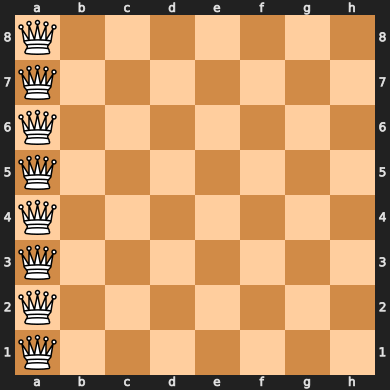

In [ ]:
state = problem_queens.get_state()
print(state)
board_layout = '/'.join([''.join(([str(s)] if s > 0 else []) + ['Q'] + ([str((7-s))] if s < 7 else [])) for s in state])
board = chess.Board(board_layout)
board

Best State: [6, 7, 6, 5, 4, 3, 2, 1]
Best Fitness: 23.0


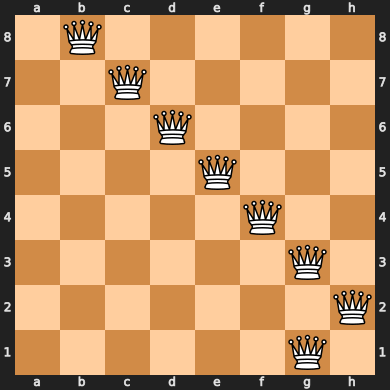

In [ ]:
import pandas as pd
from ast import literal_eval

# Create a runner class and solve the problem
rhc = RHCRunner(problem=problem_queens,
                experiment_name='queens8_rhc',
                output_directory=None,  # Note: specify an output directory to have results saved to disk
                seed=2,
                iteration_list=2 ** np.arange(11),
                max_attempts=200,
                restart_list=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20],
                population_sizes=[15, 30, 60],
                mutation_rates=[0.2, 0.4, 0.6])

# Run the algorithm
rhc_df_run_stats, rhc_df_run_curves = rhc.run()

# Get the best state and fitness
best_state_rhc = rhc_df_run_stats['State'].iloc[-1]
best_fitness_rhc = rhc_df_run_stats['Fitness'].iloc[-1]

# Display the final state
print("Best State:", best_state_rhc)
print("Best Fitness:", best_fitness_rhc)

# Convert the state to a chess board layout and display it
state = literal_eval(best_state_rhc)
board_rhc = chess.Board()

# Clear the board
board_rhc.clear_board()

# Place the white queens on the board
for col, row in enumerate(state):
    board_rhc.set_piece_at(chess.square(row, col), chess.Piece(chess.QUEEN, chess.WHITE))

# Display the chessboard
display(board_rhc)


In [ ]:
problem_queens = mlrose_hiive.DiscreteOpt(length=8, fitness_fn=fitness_queens, maximize=True, max_val=8)

[0 0 0 0 0 0 0 0]


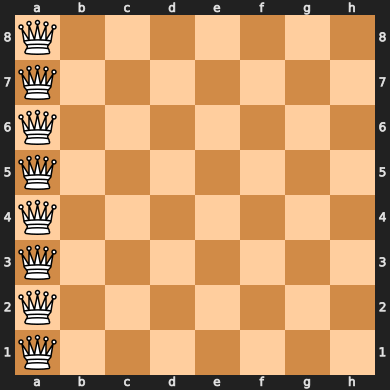

In [ ]:
state = problem_queens.get_state()
print(state)
board_layout = '/'.join([''.join(([str(s)] if s > 0 else []) + ['Q'] + ([str((7-s))] if s < 7 else [])) for s in state])
board = chess.Board(board_layout)
board

Best State: [0, 1, 2, 3, 4, 5, 6, 7]
Best Fitness: 28.0
[0, 1, 2, 3, 4, 5, 6, 7]


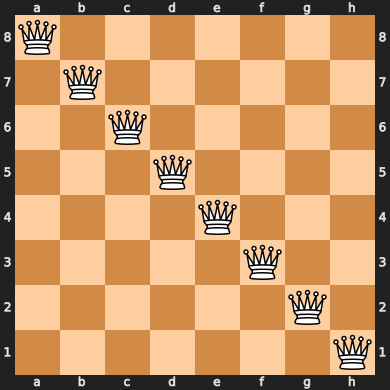

In [ ]:
import pandas as pd

# Create a runner class and solve the problem
rhc = RHCRunner(problem=problem_queens,
                experiment_name='queens8_rhc',
                output_directory=None,  # Note: specify an output directory to have results saved to disk
                seed=2,
                iteration_list=2 ** np.arange(11),
                max_attempts=150,
                restart_list=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20],
                population_sizes=[15, 30, 60],
                mutation_rates=[0.1, 0.2, 0.5])

# Run the algorithm
rhc_df_run_stats, rhc_df_run_curves = rhc.run()

# Get the best state and fitness
best_state_rhc = rhc_df_run_stats['State'].iloc[-1]
best_fitness_rhc = rhc_df_run_stats['Fitness'].iloc[-1]

# Display the final state
print("Best State:", best_state_rhc)
print("Best Fitness:", best_fitness_rhc)


# Convert the state to a chess board layout and display it
state = literal_eval(best_state_rhc)
print(state)
board_layout = '/'.join([''.join(([str(s)] if s > 0 else []) + ['Q'] + ([str((7-s))] if s < 7 else [])) for s in state])
board = chess.Board(board_layout)
board



In [ ]:
# Initialize the optimization problem
problem_queens = DiscreteOpt(length=8, fitness_fn=fitness_queens, maximize=True, max_val=8)

In [ ]:
# create a runner class and solve the problemn using Simulated Annealing
rhc = RHCRunner(problem=problem_queens,
              experiment_name='queens8_rhc',
              output_directory=None, # note: specify an output directory to have results saved to disk
              seed=2560,
              iteration_list=2 ** np.arange(11),
              max_attempts=200,
              restart_list=[0,2,4,6,8,10,12,14,16,18,20])

# the two data frames will contain the results
rhc_df_run_stats, rhc_df_run_curves = rhc.run()

In [ ]:
rhc_df_run_stats[['Iteration', 'Fitness', 'FEvals', 'Time', 'State']]
HTML(rhc_df_run_stats[['Iteration', 'Fitness', 'FEvals', 'Time', 'State']][0:12].to_html())

,Iteration,Fitness,FEvals,Time,State
0,0,9.0,0,0.002045,"[3, 4, 4, 6, 6, 4, 6, 1]"
1,1,9.0,1,0.004145,"[3, 4, 4, 6, 6, 4, 6, 1]"
2,2,9.0,2,0.005787,"[3, 4, 4, 6, 6, 4, 6, 1]"
3,4,9.0,4,0.007634,"[3, 4, 4, 6, 6, 4, 6, 1]"
4,8,9.0,8,0.009988,"[3, 4, 4, 6, 6, 4, 6, 1]"
5,16,10.0,17,0.013423,"[3, 4, 4, 6, 6, 4, 6, 7]"
6,32,12.0,35,0.019194,"[3, 4, 4, 6, 5, 4, 3, 7]"
7,64,19.0,70,0.028985,"[3, 4, 5, 6, 5, 4, 3, 2]"
8,128,20.0,135,0.047511,"[3, 4, 7, 6, 5, 4, 3, 2]"
9,256,20.0,263,0.097921,"[3, 4, 7, 6, 5, 4, 3, 2]"


In [ ]:
best_rhc_fitness = rhc_df_run_curves['Fitness'].max()
best_rhc_runs = rhc_df_run_curves[rhc_df_run_curves['Fitness'] == best_rhc_fitness]
best_rhc_runs

,Iteration,Time,Fitness,FEvals,Restarts,max_iters,current_restart
2144,116,0.044307,28.0,1018.0,4,1024,3
2145,117,0.044558,28.0,1019.0,4,1024,3
2146,118,0.044816,28.0,1020.0,4,1024,3
2147,119,0.045092,28.0,1021.0,4,1024,3
2148,120,0.045348,28.0,1022.0,4,1024,3
...,...,...,...,...,...,...,...
36857,369,0.040372,28.0,6258.0,20,1024,19
36858,370,0.040629,28.0,6259.0,20,1024,19
36859,371,0.040874,28.0,6260.0,20,1024,19
36860,372,0.041137,28.0,6261.0,20,1024,19


In [ ]:
HTML(best_rhc_runs.to_html())

,Iteration,Time,Fitness,FEvals,Restarts,max_iters,current_restart
2144,116,0.044307,28.0,1018.0,4,1024,3
2145,117,0.044558,28.0,1019.0,4,1024,3
2146,118,0.044816,28.0,1020.0,4,1024,3
2147,119,0.045092,28.0,1021.0,4,1024,3
2148,120,0.045348,28.0,1022.0,4,1024,3
2149,121,0.045610,28.0,1023.0,4,1024,3
2150,122,0.045870,28.0,1024.0,4,1024,3
2151,123,0.046152,28.0,1025.0,4,1024,3
2152,124,0.046422,28.0,1026.0,4,1024,3
2153,125,0.046692,28.0,1027.0,4,1024,3


<function matplotlib.pyplot.close(fig=None)>

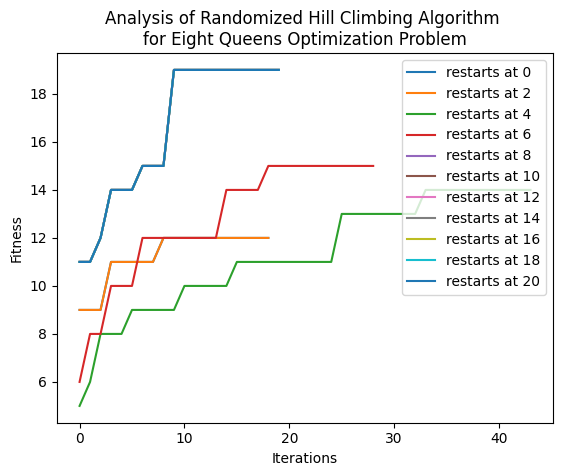

In [ ]:
plt.figure()
for restart in range(0,21,2):
    _, _, fitness_curve_rhc_8q = random_hill_climb(problem=problem_queens, restarts = restart, random_state = 2, max_iters = iterations, curve = True)

    plt.plot(fitness_curve_rhc_8q[:,0], label = f'restarts at {restart}')
plt.title('Analysis of Randomized Hill Climbing Algorithm \nfor Eight Queens Optimization Problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')
plt.close

<function matplotlib.pyplot.close(fig=None)>

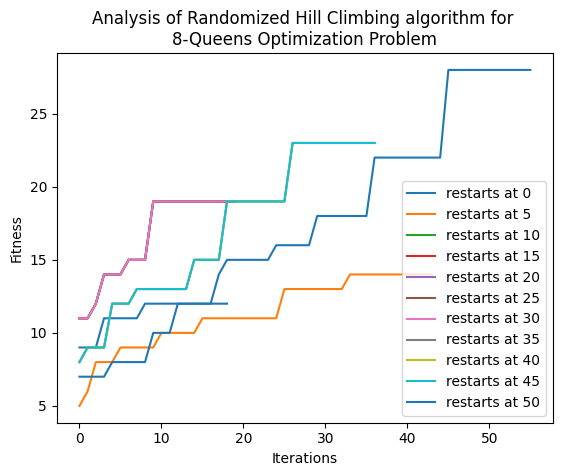

In [ ]:
plt.figure()
for restart in range(0,51,5):
    _, _, fitness_curve_rhc_8q = random_hill_climb(problem_queens, restarts = restart, random_state = 2, max_iters = iterations, curve = True)

    plt.plot(fitness_curve_rhc_8q[:,0], label = f'restarts at {restart}')
plt.title('Analysis of Randomized Hill Climbing algorithm for \n8-Queens Optimization Problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')
plt.close

<function matplotlib.pyplot.close(fig=None)>

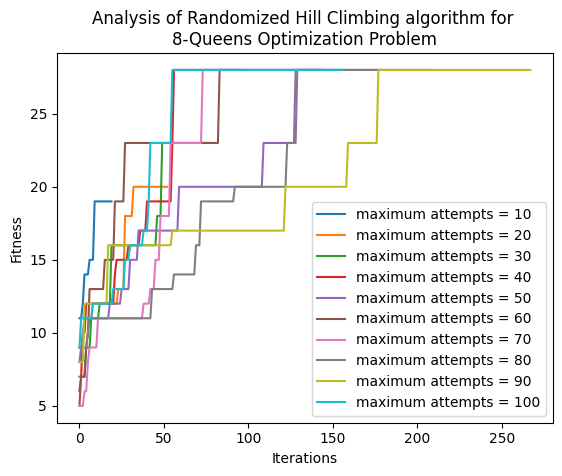

In [ ]:
plt.figure()
for attempts in range(10,110,10):
    _, _, fitness_curve_rhc_8q = random_hill_climb(problem_queens, restarts = 10, max_iters = iterations, random_state = 2, max_attempts = attempts, curve = True)

    plt.plot(fitness_curve_rhc_8q[:,0], label = f'maximum attempts = {attempts}')
plt.title('Analysis of Randomized Hill Climbing algorithm for \n8-Queens Optimization Problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')
plt.close

### Solving the 8-Queens Problem Using the Simulated Annealing (SA) algorithm

In [ ]:
problem_queens = mlrose_hiive.DiscreteOpt(length=8, fitness_fn=fitness_queens, maximize=True, max_val=8)

GeomDecay
Best value for fitness: 16.0 Total time: 0.014373540878295898
ExpDecay
Best value for fitness: 16.0 Total time: 0.014043569564819336
ArithDecay
Best value for fitness: 16.0 Total time: 0.011668682098388672


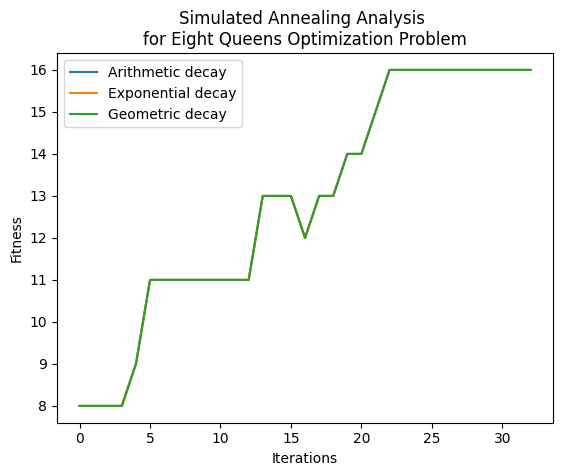

In [ ]:


def run_simulated_annealing(decay_name, decay_function):
    start_time = time.time()
    _, best_fitness, fitness_curve = simulated_annealing(
        problem=problem_queens,
        schedule=decay_function(),
        random_state=10,
        max_iters=iterations,
        curve=True
    )
    total_time = time.time() - start_time
    print(f"{decay_name}\nBest value for fitness: {best_fitness} Total time: {total_time}")
    return fitness_curve

decay_types = [("GeomDecay", GeomDecay), ("ExpDecay", ExpDecay), ("ArithDecay", ArithDecay)]
fitness_curves = []

for decay_name, decay_function in decay_types:
    fitness_curve = run_simulated_annealing(decay_name, decay_function)
    fitness_curves.append(fitness_curve)

plt.figure()
labels = ['Arithmetic decay', 'Exponential decay', 'Geometric decay']
for curve, label in zip(fitness_curves[::-1], labels):  # Reversing to match original order
    plt.plot(curve[:, 0], label=label)
plt.title('Simulated Annealing Analysis \nfor Eight Queens Optimization Problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')
plt.show()  # Changed from plt.close() to plt.show() to display the plot

<function matplotlib.pyplot.close(fig=None)>

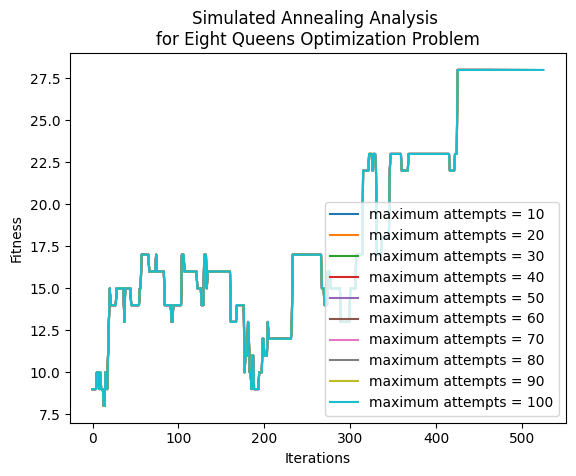

In [ ]:
plt.figure()
for attempts in range(10,110,10):
    _, _, sa_fitness_curve = simulated_annealing(problem=problem_queens, schedule = ArithDecay(), max_iters = iterations, random_state = 2, max_attempts = attempts, curve = True)

    plt.plot(sa_fitness_curve[:,0], label = f'maximum attempts = {attempts}')
plt.title('Simulated Annealing Analysis \nfor Eight Queens Optimization Problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')
plt.close

[7 6 5 4 3 2 1 0]


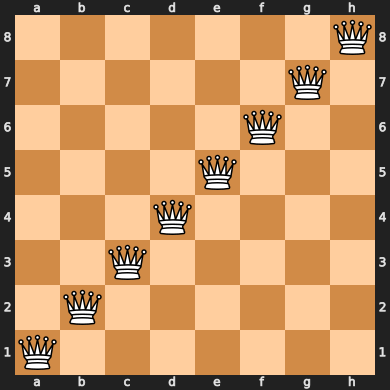

In [ ]:
state = problem_queens.get_state()
print(state)
board_layout = '/'.join([''.join(([str(s)] if s > 0 else []) + ['Q'] + ([str((7-s))] if s < 7 else [])) for s in state])
board = chess.Board(board_layout)
board

In [ ]:
# create a runner class and solve the problemn using Simulated Annealing
sa = SARunner(problem=problem_queens,
              experiment_name='queens8_sa',
              output_directory=None, # note: specify an output directory to have results saved to disk
              seed=123456,
              iteration_list=2 ** np.arange(11),
              max_attempts=500,
              temperature_list=[0.1, 0.5, 0.75, 1.0, 2.0, 5.0],
              decay_list=[mlrose_hiive.GeomDecay])

# the two data frames will contain the results
sa_df_run_stats, sa_df_run_curves = sa.run()

In [ ]:
HTML(sa_df_run_stats[['Iteration', 'Fitness', 'FEvals', 'Time', 'State']][0:12].to_html())

,Iteration,Fitness,FEvals,Time,State
0,0,11.0,0,0.001567,"[1, 2, 2, 1, 0, 3, 7, 3]"
1,1,11.0,1,0.004650,"[1, 2, 2, 1, 0, 3, 7, 3]"
2,2,11.0,2,0.006461,"[1, 2, 2, 1, 0, 3, 7, 3]"
3,4,11.0,4,0.008513,"[1, 2, 2, 1, 0, 3, 7, 3]"
4,8,11.0,9,0.011253,"[1, 2, 2, 1, 5, 3, 7, 3]"
5,16,14.0,21,0.015556,"[1, 2, 7, 4, 5, 3, 7, 5]"
6,32,19.0,39,0.021505,"[1, 2, 7, 4, 5, 6, 7, 4]"
7,64,23.0,74,0.032081,"[1, 2, 3, 4, 5, 6, 7, 6]"
8,128,23.0,140,0.052350,"[1, 2, 3, 4, 5, 6, 7, 2]"
9,256,23.0,276,0.096255,"[1, 2, 3, 4, 5, 6, 7, 6]"


In [ ]:
state_sample = sa_df_run_stats[['schedule_current_value', 'schedule_init_temp', 'schedule_min_temp']][:1]
HTML(state_sample.to_html())

,schedule_current_value,schedule_init_temp,schedule_min_temp
0,0.099998,0.1,0.001


In [ ]:
best_fitness = sa_df_run_curves['Fitness'].min()
best_runs = sa_df_run_curves[sa_df_run_curves['Fitness'] == best_fitness]

HTML(best_runs.to_html())

,Iteration,Time,Fitness,FEvals,Temperature,max_iters
4141,41,0.026081,4.0,70.0,2.0,1024
5070,103,0.044964,4.0,187.0,5.0,1024


In [ ]:
minimum_evaluations = best_runs['FEvals'].min()

best_curve_run = best_runs[best_runs['FEvals'] == minimum_evaluations]

In [ ]:
HTML(best_curve_run.to_html())

,Iteration,Time,Fitness,FEvals,Temperature,max_iters
4141,41,0.026081,4.0,70.0,2.0,1024


In [ ]:
best_init_temperature = best_curve_run['Temperature'].iloc()[0].init_temp

print(f'Best initial temperature: {best_init_temperature}')

Best initial temperature: 2.0


In [ ]:
run_stats_best_run = sa_df_run_stats[sa_df_run_stats['schedule_init_temp'] == best_init_temperature]
HTML(run_stats_best_run[['Iteration', 'Fitness', 'FEvals', 'Time', 'State']].to_html())

,Iteration,Fitness,FEvals,Time,State
48,0,11.0,0,0.000583,"[1, 2, 2, 1, 0, 3, 7, 3]"
49,1,9.0,2,0.008393,"[1, 2, 2, 0, 0, 3, 7, 3]"
50,2,10.0,4,0.016165,"[3, 2, 2, 0, 0, 3, 7, 3]"
51,4,9.0,7,0.024117,"[3, 2, 5, 0, 0, 3, 7, 3]"
52,8,10.0,14,0.032727,"[3, 2, 2, 0, 5, 3, 7, 5]"
53,16,11.0,28,0.043187,"[3, 2, 2, 4, 5, 3, 4, 5]"
54,32,8.0,54,0.056525,"[3, 5, 6, 4, 5, 2, 3, 5]"
55,64,12.0,109,0.077807,"[4, 3, 2, 1, 3, 3, 1, 7]"
56,128,17.0,188,0.106681,"[2, 3, 2, 5, 6, 5, 6, 7]"
57,256,18.0,318,0.156433,"[2, 1, 2, 7, 6, 5, 6, 7]"


[0, 1, 2, 3, 4, 5, 6, 7]


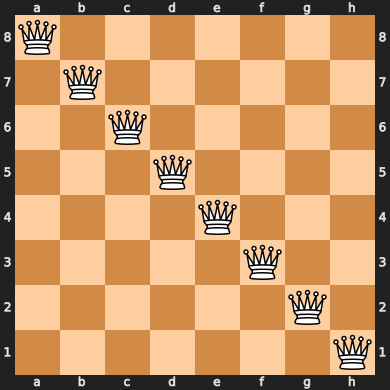

In [ ]:
state = literal_eval(run_stats_best_run['State'].tail(1).values[0])
print(state)
board_layout = '/'.join([''.join(([str(s)] if s > 0 else []) + ['Q'] + ([str((7-s))] if s < 7 else [])) for s in state])
board = chess.Board(board_layout)
board

### Solving the 8-Queens Problem using A Genetic algorithm

In [ ]:
problem_queens = mlrose_hiive.DiscreteOpt(length=8, fitness_fn=fitness_queens, maximize=True, max_val=8)

[0 0 0 0 0 0 0 0]


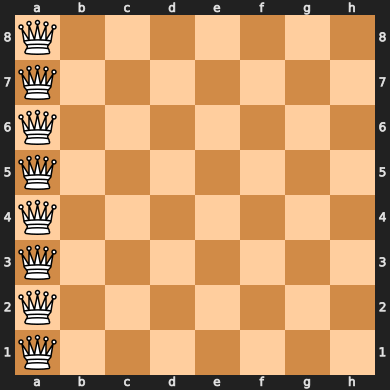

In [ ]:
state = problem_queens.get_state()
print(state)
board_layout = '/'.join([''.join(([str(s)] if s > 0 else []) + ['Q'] + ([str((7-s))] if s < 7 else [])) for s in state])
board = chess.Board(board_layout)
board


In [ ]:
# create a runner class and solve the problem
ga = GARunner(problem=problem_queens,
              experiment_name='queens8_ga',
              output_directory=None, # note: specify an output directory to have results saved to disk
              seed=123456,
              iteration_list=2 ** np.arange(11),
              population_sizes=[10, 20, 50],
              mutation_rates=[0.1, 0.2, 0.5])

# the two data frames will contain the results
df_run_stats, df_run_curves = ga.run()

In [ ]:
HTML(df_run_stats[['Iteration', 'Fitness', 'FEvals', 'Time', 'State']][0:1].to_html())

,Iteration,Fitness,FEvals,Time,State
0,0,11.0,10,0.004501,"[1, 2, 2, 1, 0, 3, 7, 3]"


In [ ]:
state_sample = df_run_stats[['Population Size', 'Mutation Rate']][:1]
HTML(state_sample.to_html())

,Population Size,Mutation Rate
0,10,0.1


In [ ]:
best_fitness = df_run_curves['Fitness'].min()
best_runs = df_run_curves[df_run_curves['Fitness'] == best_fitness]

HTML(best_runs.to_html())

,Iteration,Time,Fitness,FEvals,Population Size,Mutation Rate,max_iters
0,0,0.004501,11.0,10.0,10,0.1,1024
509,0,0.004501,11.0,10.0,10,0.2,1024
1025,0,0.004501,11.0,10.0,10,0.5,1024
2050,0,0.004501,11.0,20.0,20,0.1,1024
2570,0,0.004501,11.0,20.0,20,0.2,1024
3097,0,0.004501,11.0,20.0,20,0.5,1024
3705,0,0.004501,11.0,50.0,50,0.1,1024
4239,0,0.004501,11.0,50.0,50,0.2,1024
4757,0,0.004501,11.0,50.0,50,0.5,1024


In [ ]:
minimum_evaluations = best_runs['FEvals'].min()

best_curve_run = best_runs[best_runs['FEvals'] == minimum_evaluations]

In [ ]:
HTML(best_curve_run.to_html())

,Iteration,Time,Fitness,FEvals,Population Size,Mutation Rate,max_iters
0,0,0.004501,11.0,10.0,10,0.1,1024
509,0,0.004501,11.0,10.0,10,0.2,1024
1025,0,0.004501,11.0,10.0,10,0.5,1024


In [ ]:
best_mr = best_curve_run['Mutation Rate'].iloc()[0]
best_pop_size = best_curve_run['Population Size'].iloc()[0]
print(f'Best Mutation Rate: {best_mr}, best Population Size: {best_pop_size}')

Best Mutation Rate: 0.1, best Population Size: 10


In [ ]:
run_stats_best_run = df_run_stats[(df_run_stats['Mutation Rate'] == best_mr) & (df_run_stats['Population Size'] == best_pop_size)]
HTML(run_stats_best_run[['Iteration', 'Fitness', 'FEvals', 'Time']].to_html())

,Iteration,Fitness,FEvals,Time
0,0,11.0,10,0.004501
1,1,14.0,22,0.009353
2,2,14.0,33,0.013671
3,4,14.0,55,0.020566
4,8,20.0,100,0.032958
5,16,20.0,188,0.056000
6,32,20.0,364,0.099848
7,64,20.0,716,0.188231
8,128,20.0,1420,0.362846
9,256,20.0,2828,0.720576


In [ ]:
best_state = run_stats_best_run[['State']].tail(1)
HTML(best_state.to_html())

,State
11,"[5, 4, 1, 2, 3, 4, 5, 6]"


[5, 4, 1, 2, 3, 4, 5, 6]


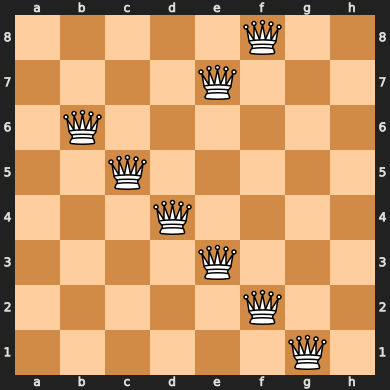

In [ ]:
state = literal_eval(run_stats_best_run['State'].tail(1).values[0])
print(state)
board_layout = '/'.join([''.join(([str(s)] if s > 0 else []) + ['Q'] + ([str((7-s))] if s < 7 else [])) for s in state])
board = chess.Board(board_layout)
board

<function matplotlib.pyplot.close(fig=None)>

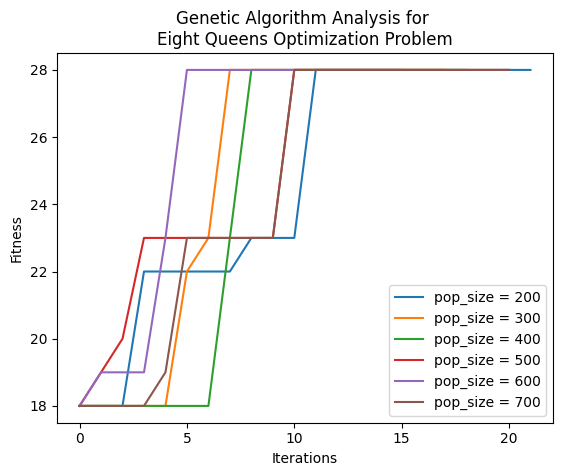

In [ ]:


# Set up the figure for plotting
plt.figure()

# Loop through population sizes from 200 to 700 in increments of 100
for population_size in range(200, 800, 100):
    # Run the genetic algorithm with the current population size

    _, _, ga_fitness_curve = genetic_alg(
        problem_queens,
        max_iters=iterations,
        random_state=2,
        pop_size=population_size,
        curve=True
    )

    # Plot the fitness curve for the current population size
    plt.plot(ga_fitness_curve[:, 0], label=f'pop_size = {population_size}')

# Configure plot titles and labels
plt.title('Genetic Algorithm Analysis for \nEight Queens Optimization Problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')
plt.close

<function matplotlib.pyplot.close(fig=None)>

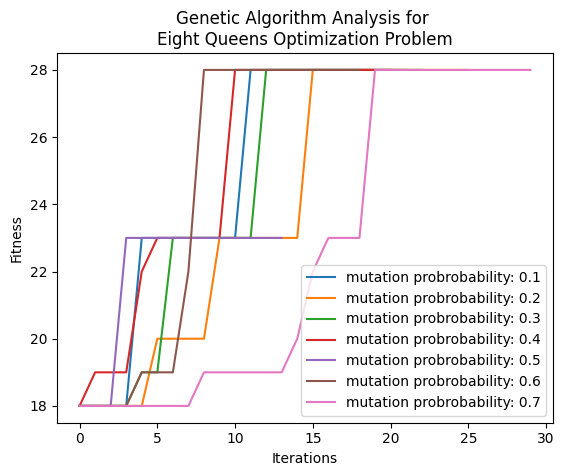

In [ ]:

probabilities = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]  # Define probabilities list for easier modification
plt.figure()

# Loop through each probability and plot the fitness curve
for prob in probabilities:
    _, _, ga_fitness_curve = genetic_alg(problem_queens, max_iters=iterations, pop_size=800, mutation_prob=prob, random_state=2, curve=True)
    plt.plot(ga_fitness_curve[:, 0], label=f'mutation probrobability: {prob}')

plt.title('Genetic Algorithm Analysis for \nEight Queens Optimization Problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')
plt.close

### Solving the 8-Queens Problem using the MIMIC algorithm

In [ ]:
problem_queens = mlrose_hiive.DiscreteOpt(length=8, fitness_fn=fitness_queens, maximize=True, max_val=8)

In [ ]:
# create a runner class and solve the problem
mimic = MIMICRunner(problem=problem_queens,
              experiment_name='queens8_mimic',
              output_directory=None, # note: specify an output directory to have results saved to disk
              seed=9,
              iteration_list=2 ** np.arange(11),
              population_sizes=[200, 300, 400, 500, 600, 700, 800, 900],
              keep_percent_list=[0.1, 0.2, 0.3, 0.4, 0.5],
              use_fast_mimic=True)

# the two data frames will contain the results
df_mimic_run_stats, df_mimic_run_curves = mimic.run()

In [ ]:
df_mimic_run_stats[['Iteration', 'Fitness', 'FEvals', 'Time', 'State']]

,Iteration,Fitness,FEvals,Time,State
0,0,6.0,200,0.042186,"[6, 4, 6, 5, 6, 0, 3, 6]"
1,1,19.0,402,0.103680,"[2.0, 7.0, 6.0, 5.0, 4.0, 3.0, 2.0, 7.0]"
2,2,19.0,603,0.152391,"[2.0, 7.0, 6.0, 5.0, 4.0, 3.0, 2.0, 7.0]"
3,4,19.0,1005,0.247530,"[2.0, 7.0, 6.0, 5.0, 4.0, 3.0, 2.0, 7.0]"
4,8,19.0,1809,0.433051,"[2.0, 7.0, 6.0, 5.0, 4.0, 3.0, 2.0, 7.0]"
...,...,...,...,...,...
475,64,28.0,58568,12.086686,"[7.0, 6.0, 5.0, 4.0, 3.0, 2.0, 1.0, 0.0]"
476,128,28.0,116232,23.695383,"[7.0, 6.0, 5.0, 4.0, 3.0, 2.0, 1.0, 0.0]"
477,256,28.0,231560,46.910971,"[7.0, 6.0, 5.0, 4.0, 3.0, 2.0, 1.0, 0.0]"
478,512,28.0,456810,92.079106,"[7.0, 6.0, 5.0, 4.0, 3.0, 2.0, 1.0, 0.0]"


In [ ]:
best_mimic_fitness = df_mimic_run_curves['Fitness'].max()
best_mimic_runs = df_mimic_run_curves[df_mimic_run_curves['Fitness'] == best_mimic_fitness]
best_mimic_runs

,Iteration,Time,Fitness,FEvals,use_fast_mimic,Population Size,Keep Percent,max_iters
3032,3,0.203028,28.0,1206.0,True,300,0.2,1024
3033,4,0.247530,28.0,1507.0,True,300,0.2,1024
3034,5,0.296057,28.0,1808.0,True,300,0.2,1024
3035,6,0.341558,28.0,2109.0,True,300,0.2,1024
3036,7,0.387534,28.0,2410.0,True,300,0.2,1024
...,...,...,...,...,...,...,...,...
20246,502,0.040676,28.0,453206.0,True,900,0.5,1024
20247,503,0.090304,28.0,454107.0,True,900,0.5,1024
20248,504,0.140634,28.0,455008.0,True,900,0.5,1024
20249,505,0.191177,28.0,455909.0,True,900,0.5,1024


In [ ]:
HTML(best_mimic_runs.to_html())

,Iteration,Time,Fitness,FEvals,use_fast_mimic,Population Size,Keep Percent,max_iters
3032,3,0.203028,28.0,1206.0,True,300,0.2,1024
3033,4,0.247530,28.0,1507.0,True,300,0.2,1024
3034,5,0.296057,28.0,1808.0,True,300,0.2,1024
3035,6,0.341558,28.0,2109.0,True,300,0.2,1024
3036,7,0.387534,28.0,2410.0,True,300,0.2,1024
3037,8,0.433051,28.0,2711.0,True,300,0.2,1024
3038,9,0.480598,28.0,3012.0,True,300,0.2,1024
3039,10,0.525150,28.0,3313.0,True,300,0.2,1024
3040,11,0.569481,28.0,3614.0,True,300,0.2,1024
3041,12,0.615046,28.0,3915.0,True,300,0.2,1024


In [ ]:
maximum_mimic_evaluations = best_mimic_runs['FEvals'].max()
best_curve_mimic_run = best_mimic_runs[best_mimic_runs['FEvals'] == maximum_mimic_evaluations]
best_curve_mimic_run

,Iteration,Time,Fitness,FEvals,use_fast_mimic,Population Size,Keep Percent,max_iters
20250,506,0.246174,28.0,456810.0,True,900,0.5,1024


In [ ]:
HTML(best_curve_mimic_run.to_html())

,Iteration,Time,Fitness,FEvals,use_fast_mimic,Population Size,Keep Percent,max_iters
20250,506,0.246174,28.0,456810.0,True,900,0.5,1024


In [ ]:
best_kpl = best_curve_mimic_run['Keep Percent'].iloc()[0]
best_pop_size = best_curve_mimic_run['Population Size'].iloc()[0]
print(f'Keep Percent List: {best_kpl}, best Population Size: {best_pop_size}')

Keep Percent List: 0.5, best Population Size: 900


In [ ]:
run_stats_best_run = df_mimic_run_stats[(df_mimic_run_stats['Keep Percent'] == best_kpl) & (df_mimic_run_stats['Population Size'] == best_pop_size)]
HTML(run_stats_best_run[['Iteration', 'Fitness', 'FEvals', 'Time']].to_html())

,Iteration,Fitness,FEvals,Time
468,0,6.0,900,0.180430
469,1,19.0,1802,0.399449
470,2,19.0,2703,0.621757
471,4,20.0,4506,1.018435
472,8,28.0,8112,1.769210
473,16,28.0,15320,3.241304
474,32,28.0,29736,6.230043
475,64,28.0,58568,12.086686
476,128,28.0,116232,23.695383
477,256,28.0,231560,46.910971


In [ ]:
best_state = run_stats_best_run[['State']].tail(1)
HTML(best_state.to_html())

,State
479,"[7.0, 6.0, 5.0, 4.0, 3.0, 2.0, 1.0, 0.0]"


[7, 6, 5, 4, 3, 2, 1, 0]


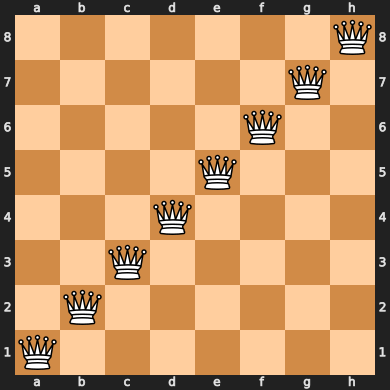

In [ ]:
state = literal_eval(run_stats_best_run['State'].tail(1).values[0])
state = [int(x) for x in state]  # Convert each element to an integer
print(state)
board_layout = '/'.join([''.join(([str(s)] if s > 0 else []) + ['Q'] + ([str((7-s))] if s < 7 else [])) for s in state])
board = chess.Board(board_layout)
board

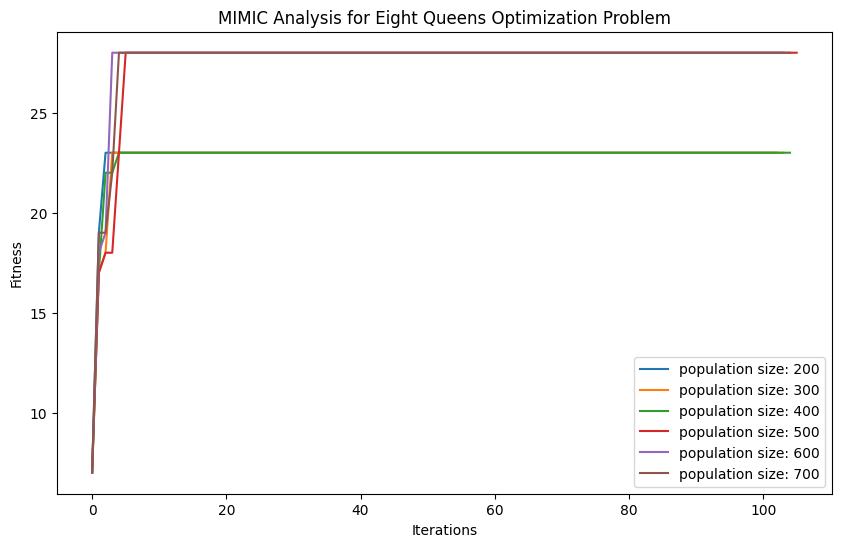

In [ ]:

problem_queens = DiscreteOpt(length=8, fitness_fn=fitness_queens, maximize=True, max_val=8)
iterations = 1000

plt.figure(figsize=(10, 6))
plt.title('MIMIC Analysis for Eight Queens Optimization Problem')
plt.xlabel('Iterations')
plt.ylabel('Fitness')

# Enable fast mode for the problem (assuming this method exists for your problem instance)
problem_queens.set_mimic_fast_mode(True)

# Generate and plot fitness curves for various population sizes
for pop_size in range(200, 800, 100):
    # Setup MIMICRunner with the current population size
    mimic_runner = MIMICRunner(problem=problem_queens,
                               experiment_name='MIMIC_Queens',
                               output_directory=None,  # Specify your output directory
                               seed=2,
                               iteration_list=2**np.arange(11),
                               max_attempts=100,
                               population_sizes=[pop_size],
                               keep_percent_list=[0.2],  # Example keep percent, adjust as needed
                               use_fast_mimic=True)

    # Run MIMIC with the current population size
    df_run_stats, df_run_curves = mimic_runner.run()

    # Filter the DataFrame for the current population size
    df_filtered = df_run_curves[(df_run_curves['Population Size'] == pop_size) & (df_run_curves['Keep Percent'] == 0.2)]

    # Sort by Iteration to ensure the curve is plotted correctly
    df_filtered = df_filtered.sort_values('Iteration')

    # Plot the fitness curve for the current population size
    plt.plot(df_filtered['Iteration'], df_filtered['Fitness'], label=f'population size: {pop_size}')

# Finalize and show the plot
plt.legend()
plt.show()


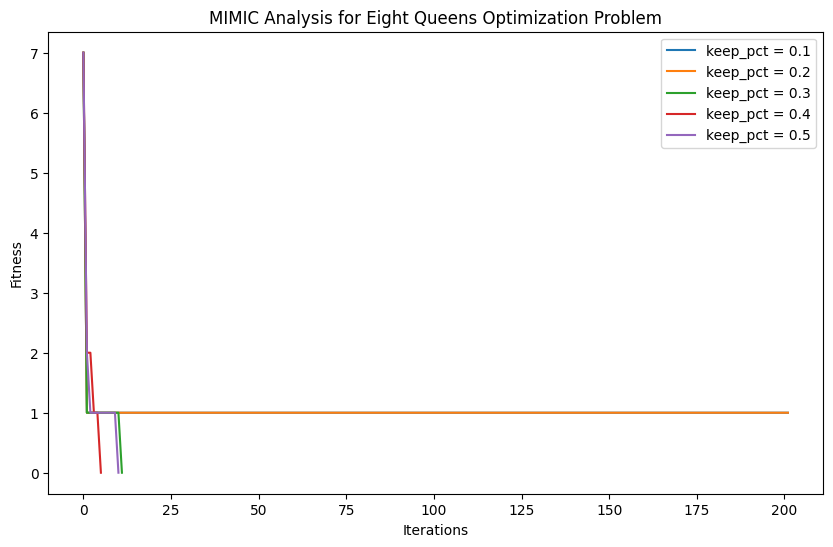

In [ ]:


def plot_fitness_curve(problem, iterations, pop_size, keep_pct, random_state):
    # Setup the MIMICRunner with the given parameters
    mimic_runner = MIMICRunner(problem=problem_queens,
                               experiment_name='MIMIC_Analysis',
                               output_directory=None,  # Specify an output directory for detailed logs
                               seed=random_state,
                               iteration_list=[iterations],
                               max_attempts=int(iterations/5),
                               population_sizes=[pop_size],
                               keep_percent_list=[keep_pct],
                               use_fast_mimic=True)

    # Execute the MIMIC algorithm
    # _, _, fitness_curve = mimic_runner.run()
    result = mimic_runner.run()  # Adjusted line here

    # Assuming the second returned value is the fitness curve, adjust accordingly if needed
    fitness_curve = result[1]  # Adjusted line here

    # Plot the fitness curve
    # plt.plot(fitness_curve[keep_pct]['Fitness'], label=f'keep_pct = {keep_pct}')
    plt.plot(fitness_curve['Fitness'], label=f'keep_pct = {keep_pct}')  # Adjusted line here

# Initialize plot
plt.figure(figsize=(10, 6))

# Set parameters
iterations = 1000  # Assuming 'iterations' is defined somewhere in your original code
problem_queens = QueensGenerator.generate(seed=2, size=8)  # Example problem initialization
problem_queens.set_mimic_fast_mode(True)
pop_size = 900
random_state = 2

# Loop through different keep_pct values and plot
for pct in [0.1, 0.2, 0.3, 0.4, 0.5]:
    plot_fitness_curve(problem_queens, iterations, pop_size, pct, random_state)

# Finalize plot
plt.title('MIMIC Analysis for Eight Queens Optimization Problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')
plt.show()

### Solving the Traveling Salesman Problem (TSP) using the Genetic Algorithm

In [ ]:
# Create list of distances between pairs of cities for ten cities
new_dist_list = [(0, 1, 3.5), (0, 2, 4.5), (0, 3, 6.0), (0, 4, 4.5), \
                 (0, 5, 5.5), (0, 6, 4.5), (0, 7, 3.0), (0, 8, 5.0), (0, 9, 6.5), \
                 (1, 2, 1.5), (1, 3, 3.0), (1, 4, 2.5), (1, 5, 4.5), (1, 6, 4.0), \
                 (1, 7, 2.5), (1, 8, 3.5), (1, 9, 5.0), (2, 3, 2.5), (2, 4, 2.5), \
                 (2, 5, 4.5), (2, 6, 5.5), (2, 7, 3.5), (2, 8, 4.0), (2, 9, 5.5), \
                 (3, 4, 2.5), (3, 5, 3.5), (3, 6, 5.0), (3, 7, 4.0), (3, 8, 5.5), \
                 (3, 9, 6.0), (4, 5, 2.0), (4, 6, 3.5), (4, 7, 2.5), (4, 8, 4.0), \
                 (4, 9, 5.5), (5, 6, 2.5), (5, 7, 3.5), (5, 8, 4.5), (5, 9, 6.0), \
                 (6, 7, 2.5), (6, 8, 3.0), (6, 9, 4.5), (7, 8, 2.5), (7, 9, 3.5), \
                 (8, 9, 2.0)]

# Initialize fitness function object using new_dist_list
fitness_dists = mlrose_hiive.TravellingSales(distances=new_dist_list)

In [ ]:
# Define optimization problem object
problem_tsp = mlrose_hiive.TSPOpt(length=10, fitness_fn=fitness_dists, maximize=True)

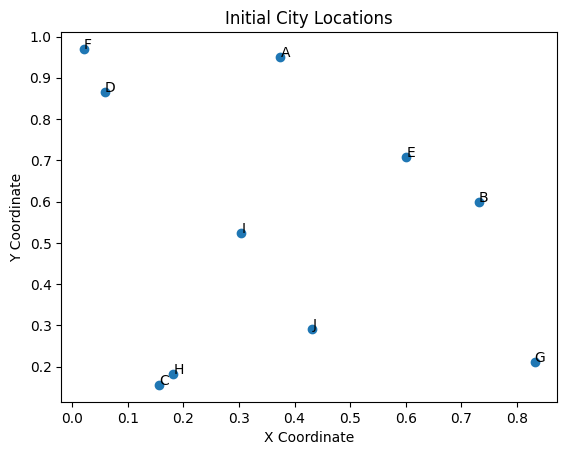

In [ ]:
# Set the random seed for reproducibility
np.random.seed(42)

# Prepare a plot, generate node labels from A to J (for 10 cities), and annotate the points with labels
fig, ax = plt.subplots()
cities = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J']
# Randomly generate city locations for visualization purposes
np.random.seed(42)
locations = np.random.rand(10, 2)
ax.scatter(locations[:, 0], locations[:, 1])
for i, city in enumerate(cities):
    ax.annotate(city, (locations[i, 0], locations[i, 1]))
plt.title("Initial City Locations")
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.show()

In [ ]:
# Create a runner class and solve the problem using the genetic algorithm
ga_tsp_runner = mlrose_hiive.GARunner(problem=problem_tsp,
                                  experiment_name="TSP_GA",
                                  output_directory=None, # specify your output directory
                                  seed=None,
                                  iteration_list=2 ** np.arange(10),
                                  max_attempts=10,
                                  population_sizes=[200],
                                  mutation_rates=[0.1])


In [ ]:
# The run method returns a DataFrame with information about each iteration
ga_stats, ga_curve = ga_tsp_runner.run()

In [ ]:
# Display the best state
best_state = ga_stats.loc[ga_stats['Fitness'].idxmin()]['State']
print("Best state (route):", best_state)

Best state (route): [9, 4, 5, 8, 7, 3, 1, 0, 6, 2]


In [ ]:
# Display the best fitness
best_fitness = ga_stats['Fitness'].min()
print("Best fitness (minimum distance):", best_fitness)

Best fitness (minimum distance): 40.5


Text(0.5, 0, 'X Coordinate')

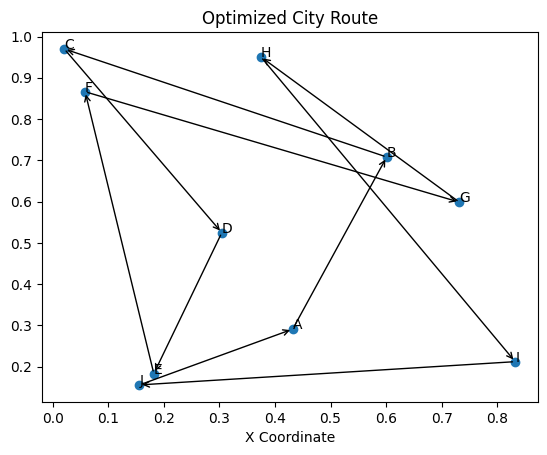

In [ ]:
import ast

# Convert the string representation of the list into an actual list of integers
best_state = ast.literal_eval(best_state)

# Set the random seed for reproducibility
#np.random.seed(42)

fig, ax = plt.subplots()
ax.scatter(locations[:, 0], locations[:, 1])
for i, city in enumerate(cities):
    ax.annotate(city, (locations[best_state[i], 0], locations[best_state[i], 1]))

# Draw lines to represent the path
for i in range(len(best_state)):
    start_pos = locations[best_state[i - 1]]
    end_pos = locations[best_state[i]]
    ax.annotate("", xy=end_pos, xycoords='data', xytext=start_pos, textcoords='data',
                arrowprops=dict(arrowstyle="->", connectionstyle="arc3"))

plt.title("Optimized City Route")
plt.xlabel("X Coordinate")

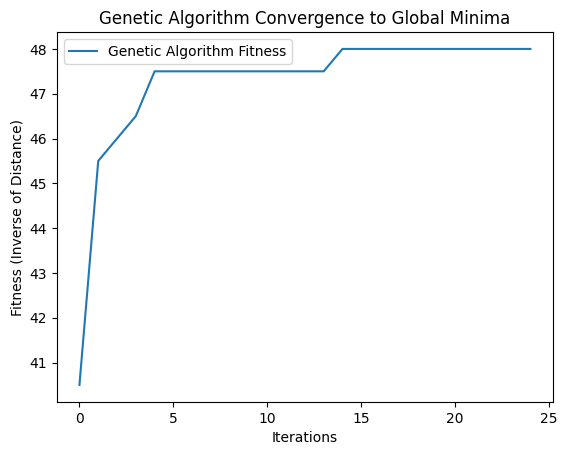

In [ ]:
# Plot the convergence to the global minima
plt.plot(ga_curve['Fitness'], label='Genetic Algorithm Fitness')
plt.title("Genetic Algorithm Convergence to Global Minima")
plt.xlabel("Iterations")
plt.ylabel("Fitness (Inverse of Distance)")
plt.legend()
plt.show()

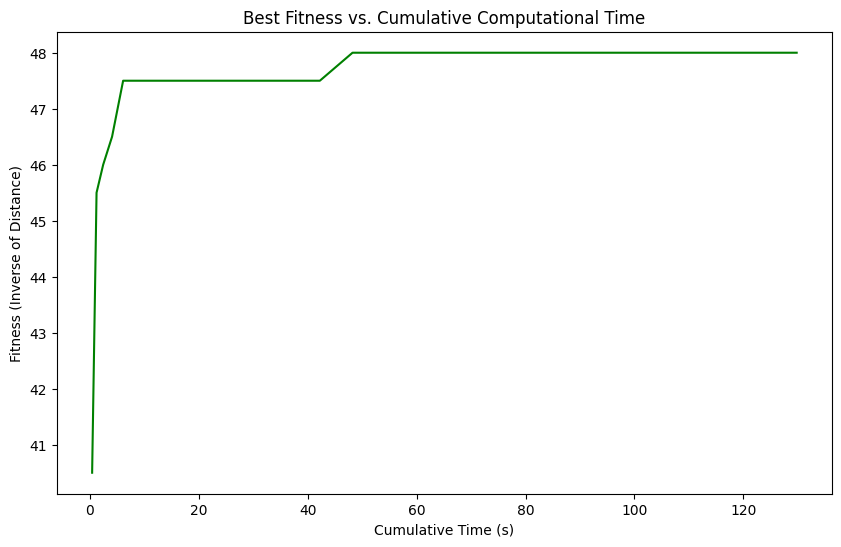

In [ ]:
# Accuracy vs. Fitness Time
# Tracking cumulative time
cumulative_time = np.cumsum(ga_curve['Time'])
plt.figure(figsize=(10, 6))
plt.plot(cumulative_time, ga_curve['Fitness'], color='green')
plt.title("Best Fitness vs. Cumulative Computational Time")
plt.xlabel("Cumulative Time (s)")
plt.ylabel("Fitness (Inverse of Distance)")
plt.show()

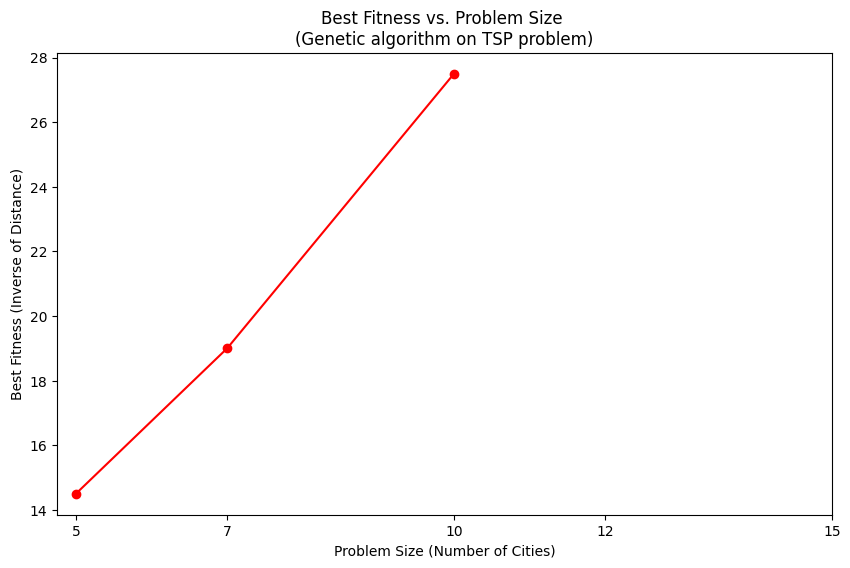

In [ ]:
# Fitness Score vs. Problem Size
# problem_sizes = [5, 7, 10, 12, 15]
problem_sizes = [5, 7, 10, 12, 15]
best_fitness_scores = []

for size in problem_sizes:
    # Redefine problem for each size
    temp_problem_fit = mlrose_hiive.TSPOpt(length=size, fitness_fn=fitness_dists, maximize=False)
    # Redefine runner for
    temp_ga_runner = mlrose_hiive.GARunner(problem=temp_problem_fit,
                                           experiment_name=f"TSP_GA_{size}",
                                           output_directory=None,
                                           seed=None,
                                           iteration_list=2 ** np.arange(10),
                                           max_attempts=10,
                                           population_sizes=[200],
                                           mutation_rates=[0.1])
    temp_ga_stats, _ = temp_ga_runner.run()
    best_fitness = temp_ga_stats['Fitness'].min()
    best_fitness_scores.append(best_fitness)

plt.figure(figsize=(10, 6))
plt.plot(problem_sizes, best_fitness_scores, marker='o', linestyle='-', color='red')
plt.title("Best Fitness vs. Problem Size \n(Genetic algorithm on TSP problem)")
plt.xlabel("Problem Size (Number of Cities)")
plt.ylabel("Best Fitness (Inverse of Distance)")
plt.xticks(problem_sizes)
plt.show()

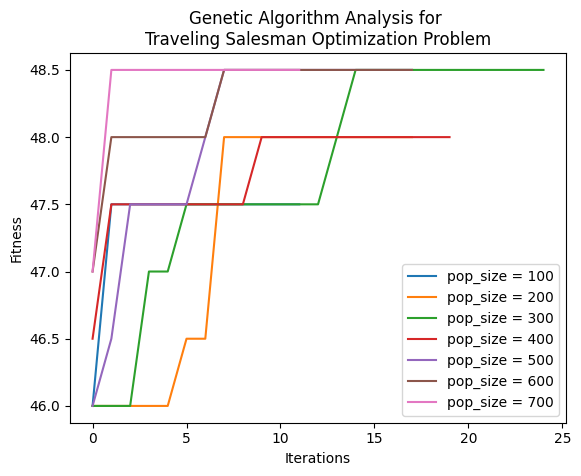

In [ ]:
# Set up the figure for plotting
plt.figure()

# Loop through population sizes from 200 to 700 in increments of 100
for population_size in range(100, 800, 100):
    # Run the genetic algorithm with the current population size
    _, _, ga_fitness_curve = genetic_alg(
        problem_tsp,
        max_iters=iterations,  # Assuming 'iterations' is defined elsewhere
        random_state=2,
        pop_size=population_size,
        curve=True
    )

    # Plot the fitness curve for the current population size
    plt.plot(ga_fitness_curve[:, 0], label=f'pop_size = {population_size}')

# Configure plot titles and labels
plt.title('Genetic Algorithm Analysis for \nTraveling Salesman Optimization Problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')

# Close the plot to prevent it from displaying in non-interactive environments
plt.show()

<Figure size 1000x600 with 0 Axes>

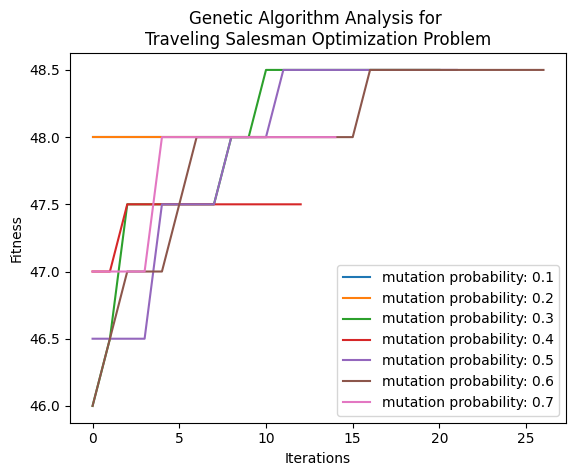

In [ ]:
probabilities = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]  # Define probabilities list for easier modification
plt.figure(figsize=(10, 6))
plt.figure()

# Loop through each probability and plot the fitness curve
for prob in probabilities:
    _, _, ga_fitness_curve = genetic_alg(problem_tsp, max_iters=iterations, pop_size=800, mutation_prob=prob, random_state=2, curve=True)
    plt.plot(ga_fitness_curve[:, 0], label=f'mutation probability: {prob}')

plt.title('Genetic Algorithm Analysis for \nTraveling Salesman Optimization Problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')
plt.show()

### Solving the Traveling Salesman Problem (TSP) using the Randomized Hill Climbing Algorithm

In [ ]:
# Create list of distances between pairs of cities for ten cities
new_dist_list = [(0, 1, 3.5), (0, 2, 4.5), (0, 3, 6.0), (0, 4, 4.5), \
                 (0, 5, 5.5), (0, 6, 4.5), (0, 7, 3.0), (0, 8, 5.0), (0, 9, 6.5), \
                 (1, 2, 1.5), (1, 3, 3.0), (1, 4, 2.5), (1, 5, 4.5), (1, 6, 4.0), \
                 (1, 7, 2.5), (1, 8, 3.5), (1, 9, 5.0), (2, 3, 2.5), (2, 4, 2.5), \
                 (2, 5, 4.5), (2, 6, 5.5), (2, 7, 3.5), (2, 8, 4.0), (2, 9, 5.5), \
                 (3, 4, 2.5), (3, 5, 3.5), (3, 6, 5.0), (3, 7, 4.0), (3, 8, 5.5), \
                 (3, 9, 6.0), (4, 5, 2.0), (4, 6, 3.5), (4, 7, 2.5), (4, 8, 4.0), \
                 (4, 9, 5.5), (5, 6, 2.5), (5, 7, 3.5), (5, 8, 4.5), (5, 9, 6.0), \
                 (6, 7, 2.5), (6, 8, 3.0), (6, 9, 4.5), (7, 8, 2.5), (7, 9, 3.5), \
                 (8, 9, 2.0)]

# Initialize fitness function object using new_dist_list
fitness_dists = mlrose_hiive.TravellingSales(distances=new_dist_list)

In [ ]:
# Define optimization problem object
problem_tsp = mlrose_hiive.TSPOpt(length=10, fitness_fn=fitness_dists, maximize=True)

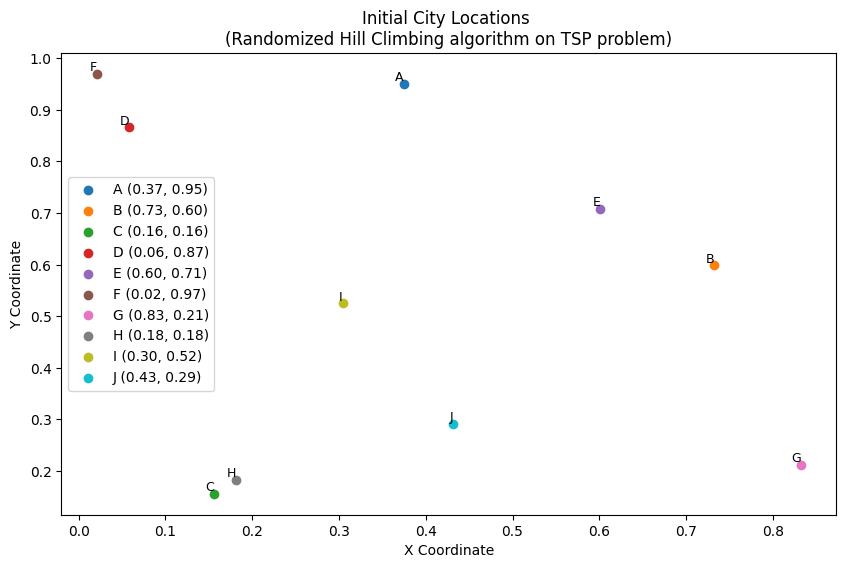

In [ ]:

# Set the random seed for reproducibility
np.random.seed(42)

# Prepare a plot, generate node labels from A to J (for 10 cities), and annotate the points with labels
coords = [(np.random.rand(), np.random.rand()) for _ in range(10)]
labels = {i: chr(65+i) for i in range(10)}

plt.figure(figsize=(10, 6))
for i, (x, y) in enumerate(coords):
    plt.scatter(x, y, label=f'{labels[i]} ({x:.2f}, {y:.2f})')
    plt.text(x, y, labels[i], fontsize=9, ha='right', va='bottom')

plt.title('Initial City Locations \n(Randomized Hill Climbing algorithm on TSP problem)')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.legend()
plt.show()

In [ ]:

# Create a runner class and solve the problem using the Randomized Hill Climbing algorithm
rhc_tsp_runner = RHCRunner(problem=problem_tsp,
                experiment_name='TSP_RHC',
                output_directory=None,
                seed=9,
                iteration_list=2 ** np.arange(11),
                max_attempts=200,
                restart_list=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20])

tsp_rhc_run_stats, tsp_rhc_run_curves = rhc_tsp_runner.run()

In [ ]:
# Display the best state
best_state_index = tsp_rhc_run_stats['Fitness'].idxmax()
best_state = tsp_rhc_run_stats.loc[best_state_index, 'State']
print('Best state:', best_state)

Best state: [1, 5, 0, 9, 4, 8, 3, 7, 2, 6]


In [ ]:
# Display the best fitness
best_fitness = tsp_rhc_run_stats.loc[best_state_index, 'Fitness']
print('Best fitness:', best_fitness)

Best fitness: 48.5


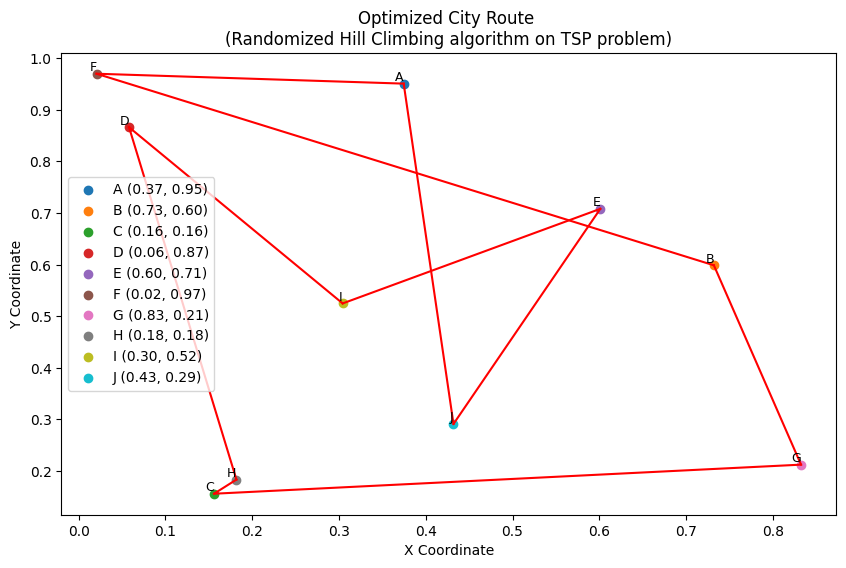

In [ ]:
# Convert the string representation of the list into an actual list of integers
best_state = ast.literal_eval(best_state)

# Set the random seed for reproducibility
#np.random.seed(42)

# Plot the results in a graph
plt.figure(figsize=(10, 6))
for i, (x, y) in enumerate(coords):
    plt.scatter(x, y, label=f'{labels[i]} ({x:.2f}, {y:.2f})')
    plt.text(x, y, labels[i], fontsize=9, ha='right', va='bottom')

for i in range(len(best_state)):
    start_pos = coords[best_state[i-1]]
    end_pos = coords[best_state[i]]
    plt.plot([start_pos[0], end_pos[0]], [start_pos[1], end_pos[1]], 'r-')

plt.title('Optimized City Route \n(Randomized Hill Climbing algorithm on TSP problem)')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.legend()
plt.show()


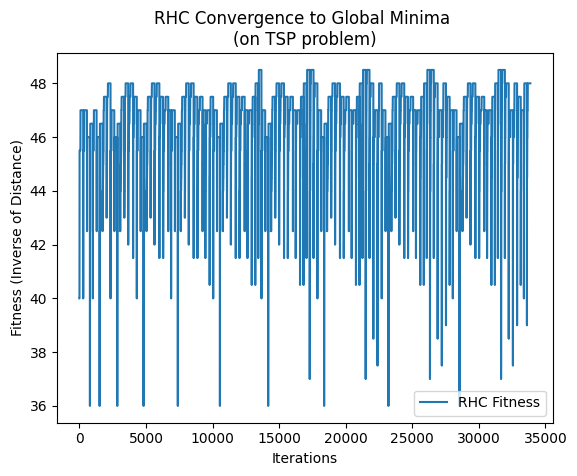

In [ ]:
# Plot the convergence to the global minima
plt.plot(tsp_rhc_run_curves['Fitness'], label='RHC Fitness')
plt.title("RHC Convergence to Global Minima \n(on TSP problem)")
plt.xlabel("Iterations")
plt.ylabel("Fitness (Inverse of Distance)")
plt.legend()
plt.show()

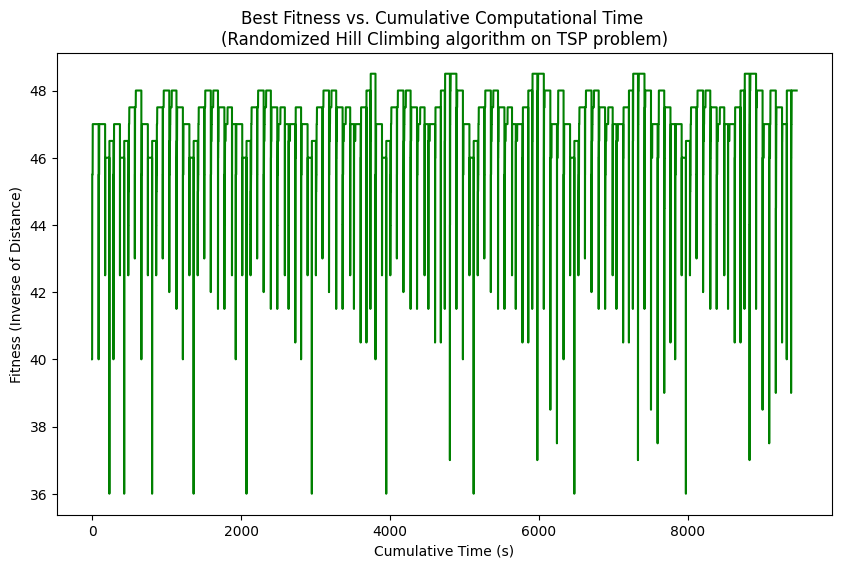

In [ ]:
# Accuracy vs. Fitness Time
# Tracking cumulative time
cumulative_time = np.cumsum(tsp_rhc_run_curves['Time'])
plt.figure(figsize=(10, 6))
plt.plot(cumulative_time, tsp_rhc_run_curves['Fitness'], color='green')
plt.title("Best Fitness vs. Cumulative Computational Time \n(Randomized Hill Climbing algorithm on TSP problem)")
plt.xlabel("Cumulative Time (s)")
plt.ylabel("Fitness (Inverse of Distance)")
plt.show()

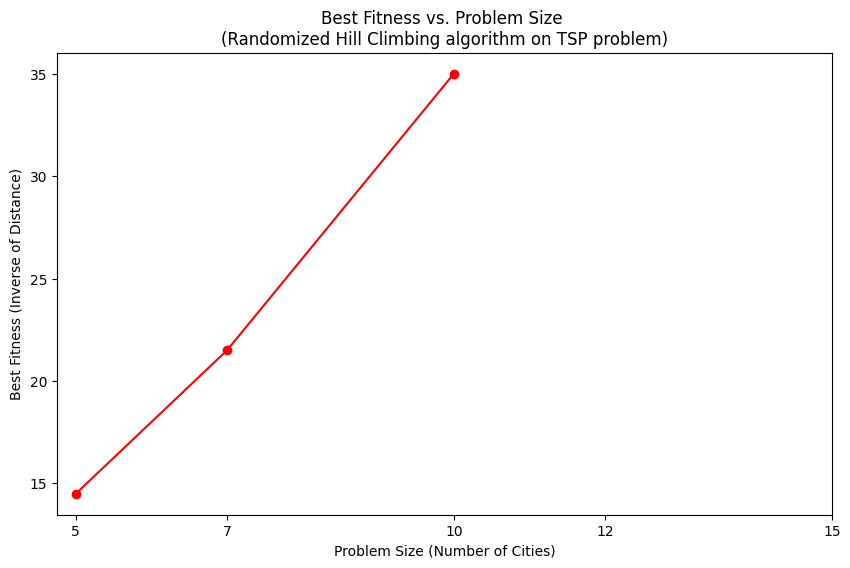

In [ ]:
# Fitness Score vs. Problem Size
problem_sizes = [5, 7, 10, 12, 15]
#problem_sizes = [10, 20, 30, 40, 50]
best_fitness_scores = []

for size in problem_sizes:
    # Redefine problem for each size
    temp_problem_rhc_tsp = mlrose_hiive.TSPOpt(length=size, fitness_fn=fitness_dists, maximize=True)
    temp_rhc_tsp_runner = mlrose_hiive.RHCRunner(problem=temp_problem_rhc_tsp,
                                           experiment_name='TSP_RHC',
                                           output_directory=None,
                                           seed=9,
                                           iteration_list=2 ** np.arange(11),
                                           max_attempts=200,
                                           restart_list=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20])
    temp_rhc_tsp_stats, _ = temp_rhc_tsp_runner.run()
    best_fitness = temp_rhc_tsp_stats['Fitness'].min()
    best_fitness_scores.append(best_fitness)

plt.figure(figsize=(10, 6))
plt.plot(problem_sizes, best_fitness_scores, marker='o', linestyle='-', color='red')
plt.title("Best Fitness vs. Problem Size \n(Randomized Hill Climbing algorithm on TSP problem)")
plt.xlabel("Problem Size (Number of Cities)")
plt.ylabel("Best Fitness (Inverse of Distance)")
plt.xticks(problem_sizes)
plt.show()

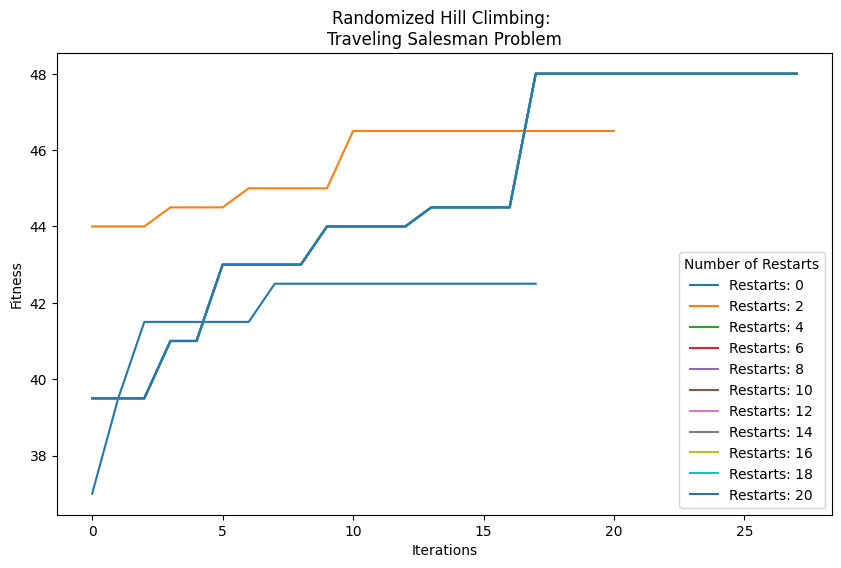

In [ ]:

def plot_fitness_curves(problem_tsp, iterations=80, max_restarts=20, step=2, random_state=2):
    plt.figure(figsize=(10, 6))
    for restart in range(0, max_restarts + 1, step):
        _, _, tsp_fitness_curve = random_hill_climb(problem=problem_tsp, restarts=restart,
                                                random_state=random_state, max_iters=iterations, curve=True)
        plt.plot(tsp_fitness_curve[:, 0], label=f'Restarts: {restart}')

    plt.title('Randomized Hill Climbing: \nTraveling Salesman Problem')
    plt.legend(title='Number of Restarts')
    plt.xlabel('Iterations')
    plt.ylabel('Fitness')
    plt.show()

# Call the function with the appropriate parameters
plot_fitness_curves(problem_tsp, iterations)

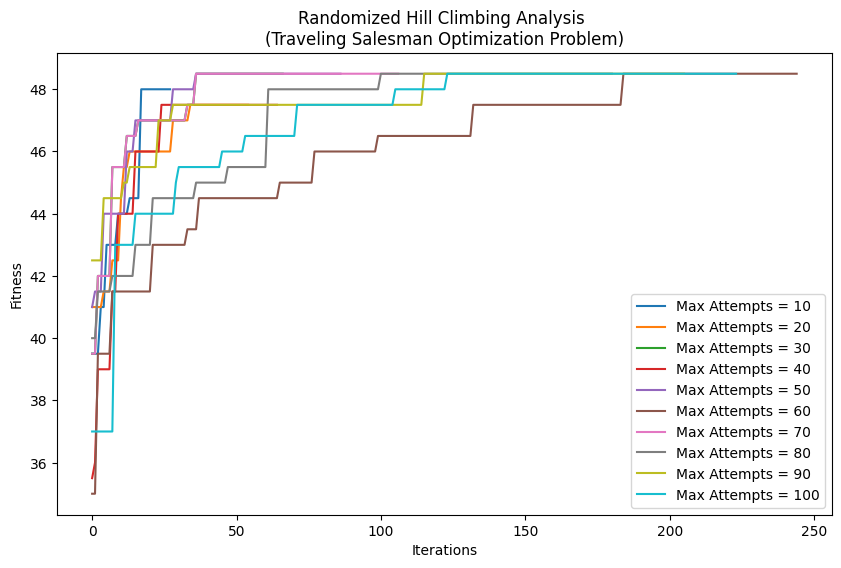

In [ ]:
#iterations = 1000
# Define a function to perform the Randomized Hill Climb and plot the results
def plot_rhc_analysis(problem, iterations, start=10, stop=110, step=10, restarts=10, random_state=2):
    plt.figure(figsize=(10, 6))

    # Loop through the specified range of maximum attempts
    for attempts in range(start, stop, step):
        # Perform Randomized Hill Climbing with the relevant parameters
        _, _, rhc_fitness_curve = random_hill_climb(
            problem_tsp,
            restarts=restarts,
            max_iters=iterations,
            random_state=random_state,
            max_attempts=attempts,
            curve=True
        )

        # Plot the fitness curve
        plt.plot(rhc_fitness_curve[:, 0], label=f'Max Attempts = {attempts}')

    # Set plot titles and labels
    plt.title('Randomized Hill Climbing Analysis \n(Traveling Salesman Optimization Problem)')
    plt.legend()
    plt.xlabel('Iterations')
    plt.ylabel('Fitness')

    # Close the plot to prevent it from displaying automatically
    plt.show()

# Assuming 'problem' and 'iterations' variables are defined elsewhere in your code
plot_rhc_analysis(problem_tsp, iterations)


### Solving the Traveling Salesman Problem (TSP) using the Simulated Annealing Algorithm

In [ ]:
# Create list of distances between pairs of cities for ten cities
new_dist_list = [(0, 1, 3.5), (0, 2, 4.5), (0, 3, 6.0), (0, 4, 4.5), \
                 (0, 5, 5.5), (0, 6, 4.5), (0, 7, 3.0), (0, 8, 5.0), (0, 9, 6.5), \
                 (1, 2, 1.5), (1, 3, 3.0), (1, 4, 2.5), (1, 5, 4.5), (1, 6, 4.0), \
                 (1, 7, 2.5), (1, 8, 3.5), (1, 9, 5.0), (2, 3, 2.5), (2, 4, 2.5), \
                 (2, 5, 4.5), (2, 6, 5.5), (2, 7, 3.5), (2, 8, 4.0), (2, 9, 5.5), \
                 (3, 4, 2.5), (3, 5, 3.5), (3, 6, 5.0), (3, 7, 4.0), (3, 8, 5.5), \
                 (3, 9, 6.0), (4, 5, 2.0), (4, 6, 3.5), (4, 7, 2.5), (4, 8, 4.0), \
                 (4, 9, 5.5), (5, 6, 2.5), (5, 7, 3.5), (5, 8, 4.5), (5, 9, 6.0), \
                 (6, 7, 2.5), (6, 8, 3.0), (6, 9, 4.5), (7, 8, 2.5), (7, 9, 3.5), \
                 (8, 9, 2.0)]

# Initialize fitness function object using new_dist_list
fitness_dists = mlrose_hiive.TravellingSales(distances=new_dist_list)

In [ ]:
# Define optimization problem object
problem_sa = mlrose_hiive.TSPOpt(length=10, fitness_fn=fitness_dists, maximize=True)

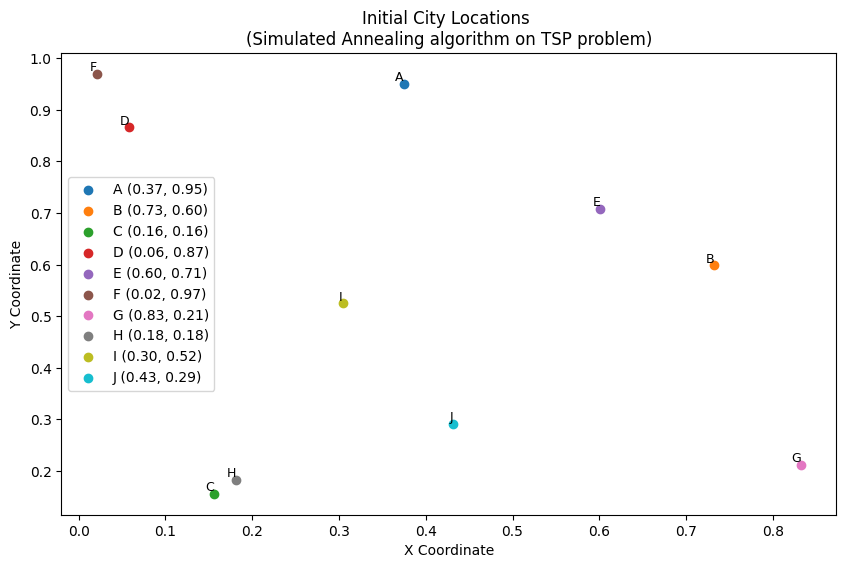

In [ ]:
# Set the random seed for reproducibility
np.random.seed(42)

# Prepare a plot, generate node labels from A to J (for 10 cities), and annotate the points with labels
coords = [(np.random.rand(), np.random.rand()) for _ in range(10)]
labels = {i: chr(65+i) for i in range(10)}

plt.figure(figsize=(10, 6))
for i, (x, y) in enumerate(coords):
    plt.scatter(x, y, label=f'{labels[i]} ({x:.2f}, {y:.2f})')
    plt.text(x, y, labels[i], fontsize=9, ha='right', va='bottom')

plt.title('Initial City Locations \n(Simulated Annealing algorithm on TSP problem)')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.legend()
plt.show()

In [ ]:
sa_tsp_runner = SARunner(problem=problem_sa,
              experiment_name='TSP_SA',
              output_directory=None, # note: specify an output directory to have results saved to disk
              seed=9,
              iteration_list=2 ** np.arange(11),
              max_attempts=100,
              #temperature_list=[0.1, 0.5, 0.75, 1.0, 2.0, 5.0],
              temperature_list=[10, 50, 100, 250, 500, 1000],
              #decay_list=[mlrose_hiive.GeomDecay])
              decay_list=[mlrose_hiive.ExpDecay])

# the two data frames will contain the results
sa_tsp_run_stats, sa_tsp_run_curves = sa_tsp_runner.run()

In [ ]:
sa_tsp_run_stats[['Iteration', 'Fitness', 'FEvals', 'Time', 'State']]

,Iteration,Fitness,FEvals,Time,State
0,0,40.0,0,0.005434,"[8, 4, 7, 2, 1, 9, 3, 0, 6, 5]"
1,1,33.5,2,0.012582,"[8, 4, 3, 2, 1, 9, 7, 0, 6, 5]"
2,2,36.5,4,0.018199,"[8, 0, 3, 2, 1, 9, 7, 4, 6, 5]"
3,4,42.0,8,0.027575,"[8, 0, 3, 2, 9, 5, 7, 4, 6, 1]"
4,8,43.0,15,0.042692,"[8, 7, 3, 1, 0, 5, 9, 4, 6, 2]"
...,...,...,...,...,...
67,64,42.0,128,0.330868,"[1, 7, 5, 0, 6, 4, 9, 2, 3, 8]"
68,128,40.5,255,0.587574,"[2, 4, 9, 7, 3, 0, 6, 5, 1, 8]"
69,256,36.0,509,1.104107,"[9, 7, 4, 2, 3, 5, 0, 6, 8, 1]"
70,512,36.0,1019,2.147428,"[7, 2, 3, 5, 9, 8, 0, 1, 6, 4]"


In [ ]:
best_sa_tsp_fitness = sa_tsp_run_curves['Fitness'].max()
best_sa_tsp_runs = sa_tsp_run_curves[sa_tsp_run_curves['Fitness'] == best_sa_tsp_fitness]
best_sa_tsp_runs

,Iteration,Time,Fitness,FEvals,Temperature,max_iters
2997,947,2.834707,48.0,1706.0,100,1024
2998,948,2.837037,48.0,1707.0,100,1024
2999,949,2.839335,48.0,1708.0,100,1024
3000,950,2.841556,48.0,1709.0,100,1024
3001,951,2.843785,48.0,1710.0,100,1024
3002,952,2.845992,48.0,1711.0,100,1024


In [ ]:
maximum_sa_tsp_evaluations = best_sa_tsp_runs['FEvals'].max()
best_curve_sa_tsp_run = best_sa_tsp_runs[best_sa_tsp_runs['FEvals'] == maximum_sa_tsp_evaluations]
best_curve_sa_tsp_run

,Iteration,Time,Fitness,FEvals,Temperature,max_iters
3002,952,2.845992,48.0,1711.0,100,1024


In [ ]:
# Disply the best state
# print("Best State:\n", best_state)
#print("Best State:", maximum_sa_tsp_evaluations)

best_state_index = sa_tsp_run_stats['Fitness'].idxmax()
best_state = sa_tsp_run_stats.loc[best_state_index, 'State']
print('Best state:', best_state)

Best state: [7, 5, 1, 6, 2, 9, 4, 0, 8, 3]


In [ ]:
# Display the best fitness
# print("Best Fitness:", best_fitness)
print("Best Fitness:", best_sa_tsp_fitness)

Best Fitness: 48.0


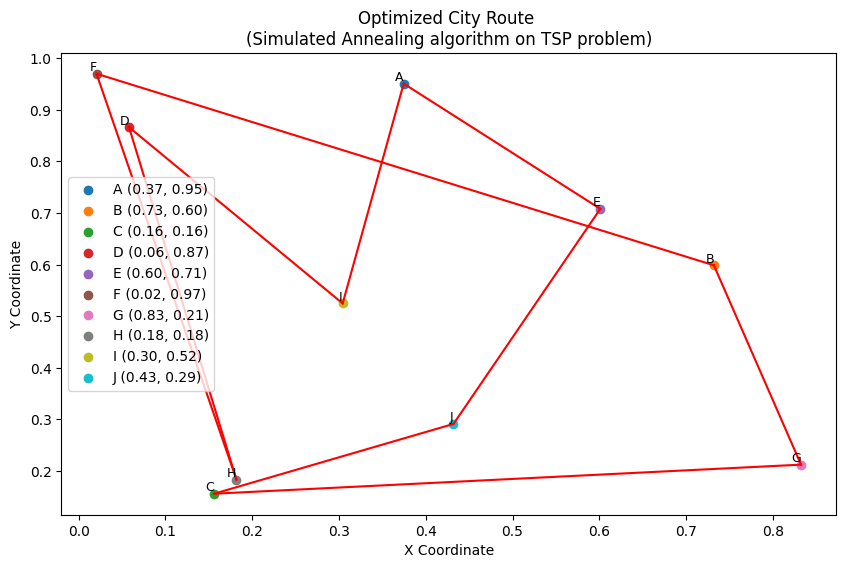

In [ ]:
# Convert the string representation of the list into an actual list of integers
best_state = ast.literal_eval(best_state)

# Plot the results in a graph
plt.figure(figsize=(10, 6))
for i, (x, y) in enumerate(coords):
    plt.scatter(x, y, label=f'{labels[i]} ({x:.2f}, {y:.2f})')
    plt.text(x, y, labels[i], fontsize=9, ha='right', va='bottom')

for i in range(len(best_state)):
    start_pos = coords[best_state[i-1]]
    end_pos = coords[best_state[i]]
    plt.plot([start_pos[0], end_pos[0]], [start_pos[1], end_pos[1]], 'r-')

plt.title('Optimized City Route \n(Simulated Annealing algorithm on TSP problem)')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.legend()
plt.show()



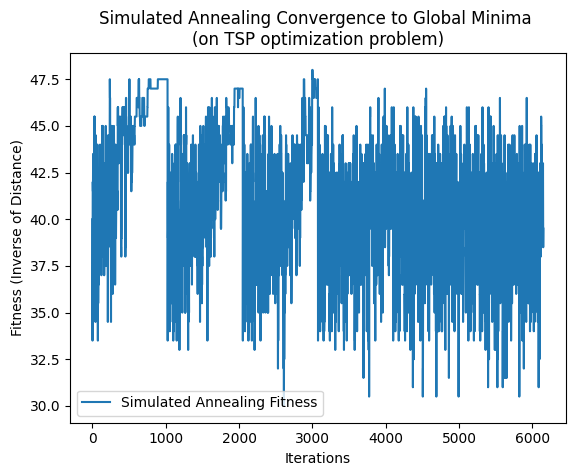

In [ ]:
# Plot the convergence to the global minima
plt.plot(sa_tsp_run_curves['Fitness'], label='Simulated Annealing Fitness')
plt.title("Simulated Annealing Convergence to Global Minima \n(on TSP optimization problem)")
plt.xlabel("Iterations")
plt.ylabel("Fitness (Inverse of Distance)")
plt.legend()
plt.show()

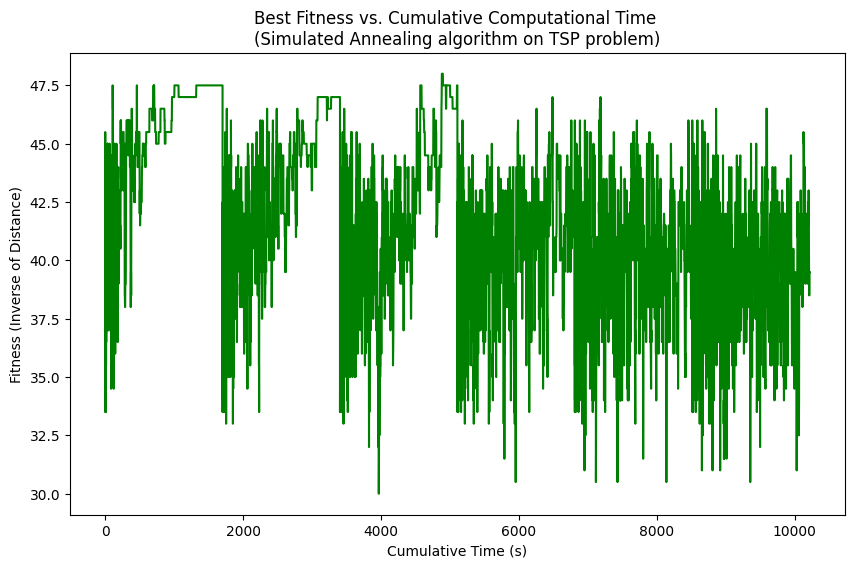

In [ ]:
# Accuracy vs. Fitness Time
# Tracking cumulative time
cumulative_time = np.cumsum(sa_tsp_run_curves['Time'])
plt.figure(figsize=(10, 6))
plt.plot(cumulative_time, sa_tsp_run_curves['Fitness'], color='green')
plt.title("Best Fitness vs. Cumulative Computational Time \n(Simulated Annealing algorithm on TSP problem)")
plt.xlabel("Cumulative Time (s)")
plt.ylabel("Fitness (Inverse of Distance)")
plt.show()

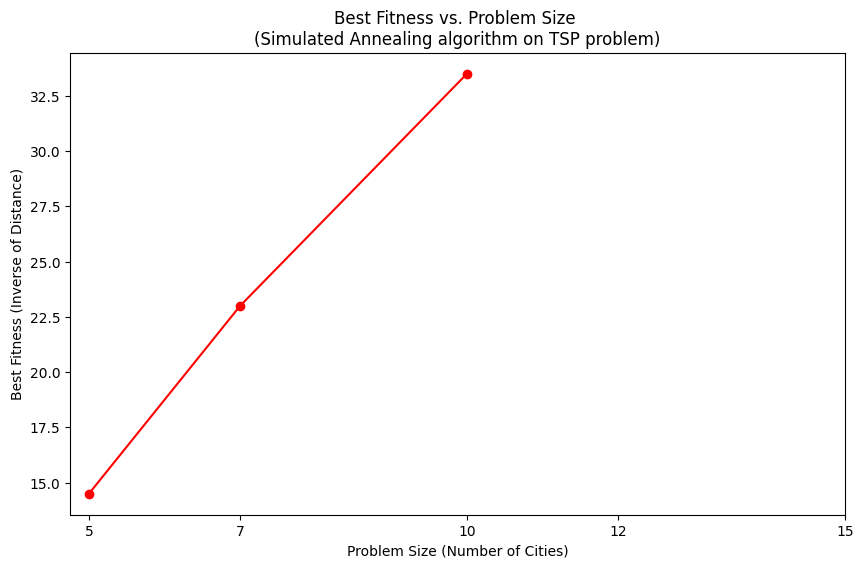

In [ ]:
# Fitness Score vs. Problem Size
problem_sizes = [5, 7, 10, 12, 15]
#problem_sizes = [10, 20, 30, 40, 50]
best_fitness_scores = []

for size in problem_sizes:
    # Redefine problem for each size
    temp_problem_sa_tsp = mlrose_hiive.TSPOpt(length=size, fitness_fn=fitness_dists, maximize=True)
    temp_sa_tsp_runner = mlrose_hiive.SARunner(problem=temp_problem_sa_tsp,
                                           experiment_name='TSP_SA',
                                           output_directory=None,
                                           seed=9,
                                           iteration_list=2 ** np.arange(11),
                                           max_attempts=100,
                                           temperature_list=[10, 50, 100, 250, 500, 1000],
                                           decay_list=[mlrose_hiive.ExpDecay])
    temp_sa_tsp_stats, _ = temp_sa_tsp_runner.run()
    best_fitness = temp_sa_tsp_stats['Fitness'].min()
    best_fitness_scores.append(best_fitness)

plt.figure(figsize=(10, 6))
plt.plot(problem_sizes, best_fitness_scores, marker='o', linestyle='-', color='red')
plt.title("Best Fitness vs. Problem Size \n(Simulated Annealing algorithm on TSP problem)")
plt.xlabel("Problem Size (Number of Cities)")
plt.ylabel("Best Fitness (Inverse of Distance)")
plt.xticks(problem_sizes)
plt.show()

In [ ]:

# List of decay strategies with their corresponding labels
decay_strategies = [("GeomDecay", GeomDecay()), ("ExpDecay", ExpDecay()), ("ArithDecay", ArithDecay())]

for label, strategy in decay_strategies:
    start_time = time.time()
    _, best_fitness, fitness_curve = simulated_annealing(problem_sa, schedule=strategy, random_state=2, max_iters=iterations, curve=True)
    total_time = time.time() - start_time
    print(f"{label}")
    print(f"Best fitness: {best_fitness} Total time: {total_time}")



GeomDecay
Best fitness: 45.5 Total time: 0.12653088569641113
ExpDecay
Best fitness: 45.5 Total time: 0.12378406524658203
ArithDecay
Best fitness: 46.5 Total time: 0.5005223751068115


Geometric Decay
Best fitness: 45.5 Total time: 0.12757158279418945
Exponential Decay
Best fitness: 45.5 Total time: 0.13048028945922852
Arithmetic Decay
Best fitness: 46.5 Total time: 0.49805212020874023


<function matplotlib.pyplot.close(fig=None)>

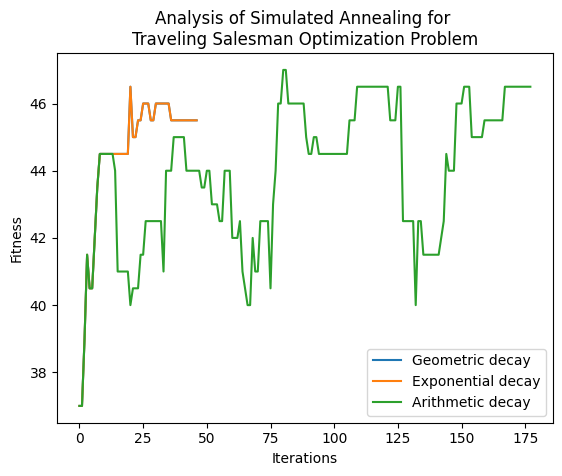

In [ ]:

problem_sa = mlrose_hiive.TSPOpt(length=10, fitness_fn=fitness_dists, maximize=True)

GeomDecay_start_time = time.time()
_, GeomDecay_best_fitness, sa_fitness_curve1 = simulated_annealing(problem=problem_sa, schedule = GeomDecay(), random_state = 2, max_iters = iterations, curve = True)
GeomDecay_total_time = time.time() - GeomDecay_start_time
print("Geometric Decay")
print("Best fitness: "+str(GeomDecay_best_fitness)+" Total time: "+str(GeomDecay_total_time))

ExpDecay_start_time = time.time()
_, ExpDecay_best_fitness, sa_fitness_curve2 = simulated_annealing(problem=problem_sa, schedule = ExpDecay(),  random_state = 2, max_iters = iterations, curve = True)
ExpDecay_total_time = time.time() - ExpDecay_start_time
print("Exponential Decay")
print("Best fitness: "+str(ExpDecay_best_fitness)+" Total time: "+str(ExpDecay_total_time))

ArithDecay_start_time = time.time()
_, ArithDecay_best_fitness, sa_fitness_curve3 = simulated_annealing(problem=problem_sa, schedule = ArithDecay(), random_state = 2, max_iters = iterations, curve = True)
ArithDecay_total_time = time.time() - ArithDecay_start_time
print("Arithmetic Decay")
print("Best fitness: "+str(ArithDecay_best_fitness)+" Total time: "+str(ArithDecay_total_time))



plt.figure()
plt.figsizes=(10,6)
plt.plot(sa_fitness_curve1[:,0], label = 'Geometric decay')
plt.plot(sa_fitness_curve2[:,0], label = 'Exponential decay')
plt.plot(sa_fitness_curve3[:,0], label = 'Arithmetic decay')
plt.title('Analysis of Simulated Annealing for \nTraveling Salesman Optimization Problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')
plt.close

Geometric Decay
Best fitness: 45.5 Total time: 0.1261448860168457
Exponential Decay
Best fitness: 45.5 Total time: 0.12398004531860352
Arithmetic Decay
Best fitness: 46.5 Total time: 0.48808813095092773


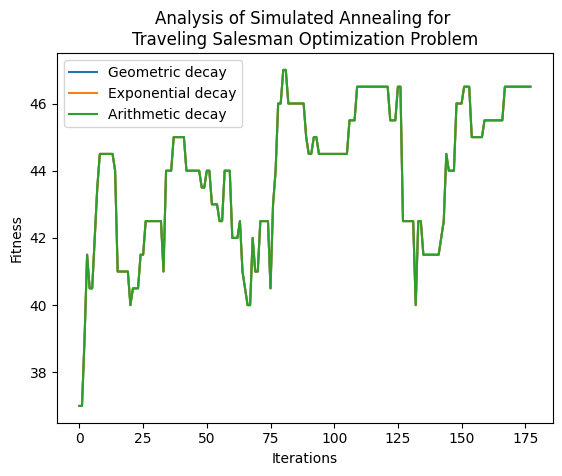

In [ ]:

def run_simulated_annealing(schedule_name, schedule_obj, problem, random_state, max_iters):
    start_time = time.time()
    #_, best_fitness, fitness_curve = simulated_annealing(problem=problem_tsp, schedule=schedule_obj, random_state=random_state, max_iters=max_iters, curve=True)
    _, best_fitness, ftiness_curve = simulated_annealing(problem=problem_sa, schedule=schedule_obj, random_state=2, max_iters=max_iters, curve=True)

    total_time = time.time() - start_time
    print(f"{schedule_name} Decay")
    print(f"Best fitness: {best_fitness} Total time: {total_time}")
    return fitness_curve

# Assuming problem_sa, simulated_annealing, GeomDecay, ExpDecay, ArithDecay are already defined
random_state = 2
iterations = 1000  # Assuming 'iterations' is defined earlier in the code

# Run simulated annealing with different decay schedules
sa_fitness_curve1 = run_simulated_annealing("Geometric", GeomDecay(), problem_sa, random_state, iterations)
sa_fitness_curve2 = run_simulated_annealing("Exponential", ExpDecay(), problem_sa, random_state, iterations)
sa_fitness_curve3 = run_simulated_annealing("Arithmetic", ArithDecay(), problem_sa, random_state, iterations)

# Plotting the fitness curves
plt.figure()
plt.figsizes=(10,6)
plt.plot(sa_fitness_curve1[:, 0], label='Geometric decay')
plt.plot(sa_fitness_curve2[:, 0], label='Exponential decay')
plt.plot(sa_fitness_curve3[:, 0], label='Arithmetic decay')
plt.title('Analysis of Simulated Annealing for \nTraveling Salesman Optimization Problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')
plt.show()  # Replaced plt.close with plt.show() to display the plot

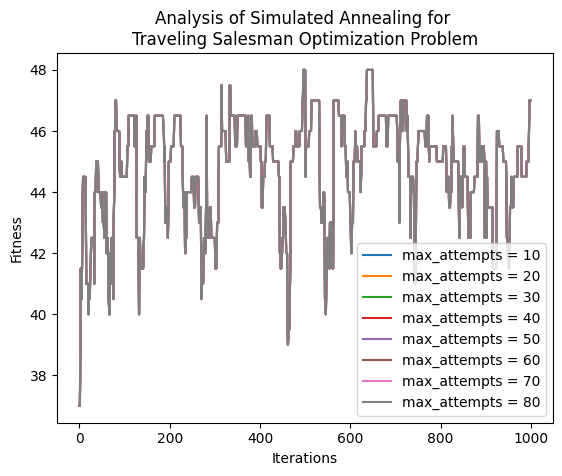

In [ ]:
plt.figure()
for attempts in range(10,90,10):
    _, _, sa_fitness_curve = simulated_annealing(problem_sa, schedule = ArithDecay(), max_iters = iterations, random_state = 2, max_attempts = attempts, curve = True)

    plt.plot(sa_fitness_curve[:,0], label = f'max_attempts = {attempts}')
plt.title('Analysis of Simulated Annealing for \nTraveling Salesman Optimization Problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')
plt.show()

### Solving the Traveling Salesman Problem (TSP) using the MIMIC Algorithm

In [ ]:
# Create list of distances between pairs of cities for ten cities
new_dist_list = [(0, 1, 3.5), (0, 2, 4.5), (0, 3, 6.0), (0, 4, 4.5), \
                 (0, 5, 5.5), (0, 6, 4.5), (0, 7, 3.0), (0, 8, 5.0), (0, 9, 6.5), \
                 (1, 2, 1.5), (1, 3, 3.0), (1, 4, 2.5), (1, 5, 4.5), (1, 6, 4.0), \
                 (1, 7, 2.5), (1, 8, 3.5), (1, 9, 5.0), (2, 3, 2.5), (2, 4, 2.5), \
                 (2, 5, 4.5), (2, 6, 5.5), (2, 7, 3.5), (2, 8, 4.0), (2, 9, 5.5), \
                 (3, 4, 2.5), (3, 5, 3.5), (3, 6, 5.0), (3, 7, 4.0), (3, 8, 5.5), \
                 (3, 9, 6.0), (4, 5, 2.0), (4, 6, 3.5), (4, 7, 2.5), (4, 8, 4.0), \
                 (4, 9, 5.5), (5, 6, 2.5), (5, 7, 3.5), (5, 8, 4.5), (5, 9, 6.0), \
                 (6, 7, 2.5), (6, 8, 3.0), (6, 9, 4.5), (7, 8, 2.5), (7, 9, 3.5), \
                 (8, 9, 2.0)]

# Initialize fitness function object using new_dist_list
fitness_dists = mlrose_hiive.TravellingSales(distances=new_dist_list)

In [ ]:
# Define optimization problem object
problem_tsp_mimic = mlrose_hiive.TSPOpt(length=10, fitness_fn=fitness_dists, maximize=True)

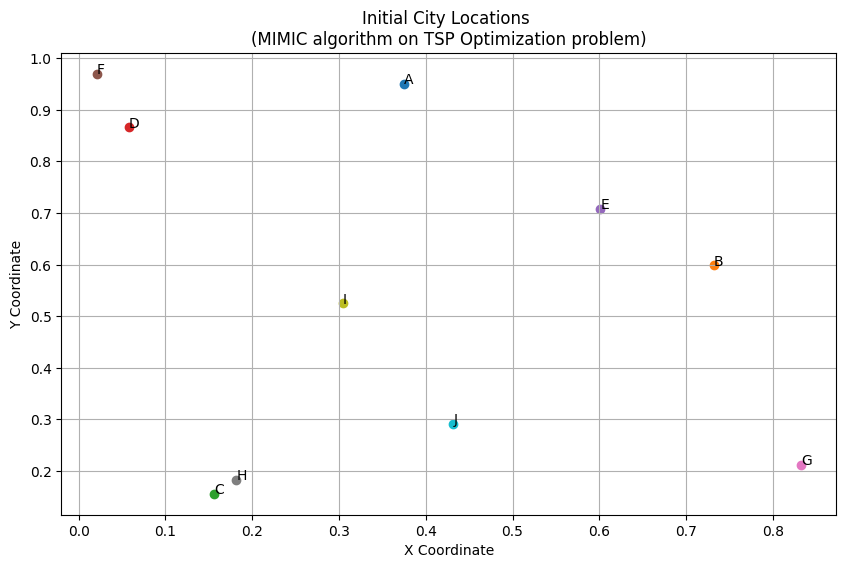

In [ ]:
# Set the random seed for reproducibility
np.random.seed(42)

# Prepare a plot, generate node labels from A to J (for 10 cities), and annotate the points with labels
coords = np.random.rand(10, 2)  # Randomly generate coordinates for the cities for visualization

plt.figure(figsize=(10, 6))
for i, (x, y) in enumerate(coords):
    plt.scatter(x, y)
    plt.annotate(chr(65 + i), (x, y))

plt.title('Initial City Locations \n(MIMIC algorithm on TSP Optimization problem)')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.grid(True)
plt.show()

In [ ]:
# Create a runner class and solve the problem using MIMIC
from mlrose_hiive import MIMICRunner

mimic_tsp_runner = MIMICRunner(problem=problem_tsp_mimic,
                           experiment_name="TSP_MIMIC",
                           output_directory=None,
                           seed=9,
                           iteration_list=2 ** np.arange(12),
                           max_attempts=100,
                           population_sizes=[200, 300, 400, 500, 600, 700, 800, 900],
                           keep_percent_list=[0.1, 0.2, 0.3, 0.4, 0.5],
                           use_fast_mimic=True)

# Run the MIMIC algorithm
mimic_tsp_stats, mimic_tsp_curve = mimic_tsp_runner.run()

In [ ]:
# Display the best state
best_state = mimic_tsp_stats.loc[mimic_tsp_stats['Fitness'].idxmax()]['State']
print(f"Best State:\n{best_state}")

Best State:
[1, 6, 2, 7, 3, 8, 4, 9, 0, 5]


In [ ]:
# Display the best fitness
best_fitness = mimic_tsp_stats['Fitness'].max()
print(f"Best Fitness: {best_fitness}")

Best Fitness: 48.5


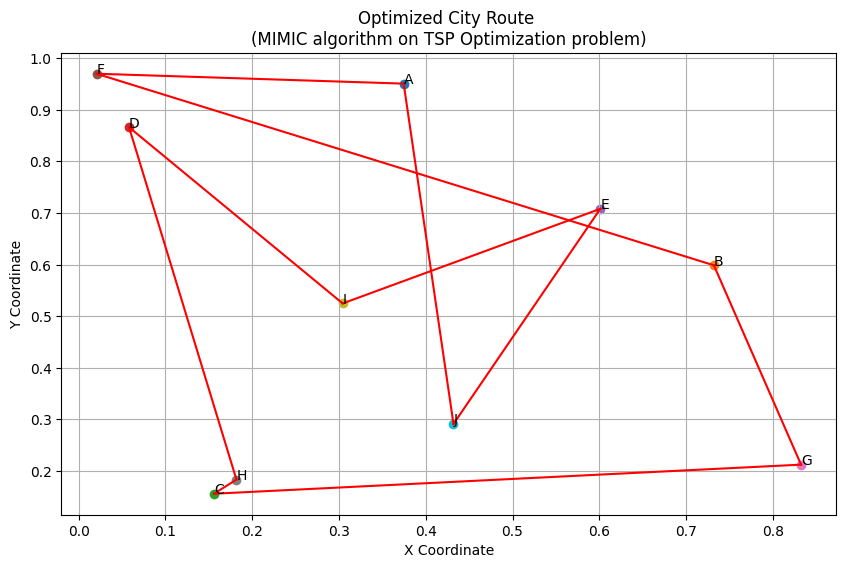

In [ ]:
# Convert the string representation of the list into an actual list of integers
best_state = ast.literal_eval(best_state)

# Plot the results in a graph showing the path
plt.figure(figsize=(10, 6))
for i, (x, y) in enumerate(coords):
    plt.scatter(x, y)
    plt.annotate(chr(65 + i), (x, y))

# Draw lines for the best state
for i in range(len(best_state)):
    start_pos = coords[best_state[i - 1]]
    end_pos = coords[best_state[i]]
    plt.plot([start_pos[0], end_pos[0]], [start_pos[1], end_pos[1]], 'r-')

plt.title('Optimized City Route \n(MIMIC algorithm on TSP Optimization problem)')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.grid(True)
plt.show()

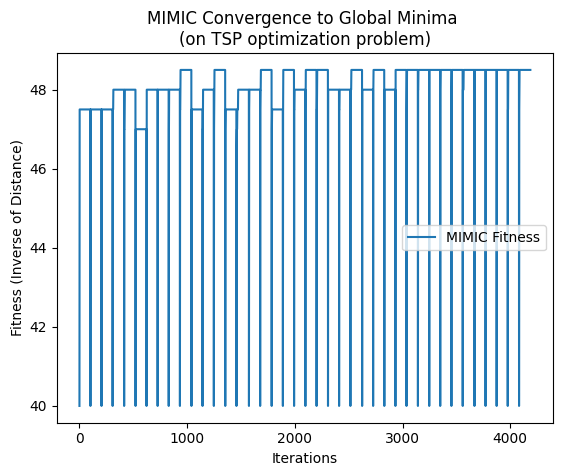

In [ ]:
# Plot the convergence to the global minima
plt.plot(mimic_tsp_curve['Fitness'], label='MIMIC Fitness')
plt.title("MIMIC Convergence to Global Minima \n(on TSP optimization problem)")
plt.xlabel("Iterations")
plt.ylabel("Fitness (Inverse of Distance)")
plt.legend()
plt.show()

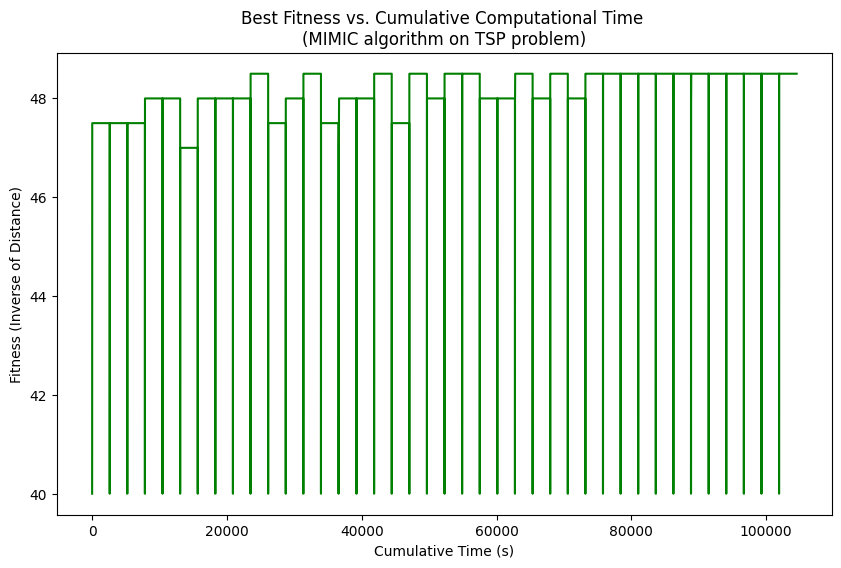

In [ ]:
# Accuracy vs. Fitness Time
# Tracking cumulative time
cumulative_time = np.cumsum(mimic_tsp_curve['Time'])
plt.figure(figsize=(10, 6))
plt.plot(cumulative_time, mimic_tsp_curve['Fitness'], color='green')
plt.title("Best Fitness vs. Cumulative Computational Time \n(MIMIC algorithm on TSP problem)")
plt.xlabel("Cumulative Time (s)")
plt.ylabel("Fitness (Inverse of Distance)")
plt.show()

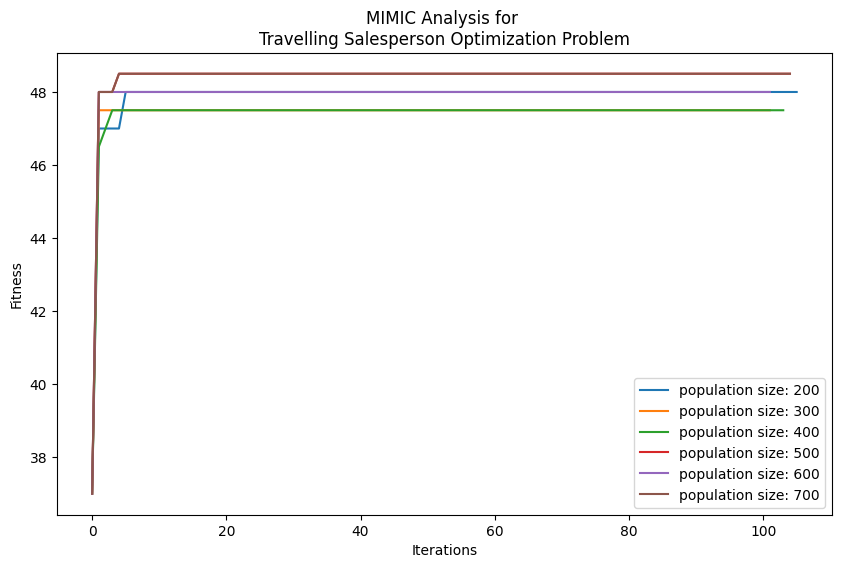

In [ ]:

iterations = 1000

plt.figure(figsize=(10, 6))
plt.title('MIMIC Analysis for \nTravelling Salesperson Optimization Problem')
plt.xlabel('Iterations')
plt.ylabel('Fitness')

# Enable fast mode for the problem (assuming this method exists for your problem instance)
problem_tsp_mimic.set_mimic_fast_mode(True)

# Generate and plot fitness curves for various population sizes
for pop_size in range(200, 800, 100):
    # Setup MIMICRunner with the current population size
    tsp_mimic_runner = MIMICRunner(problem=problem_tsp_mimic,
                               experiment_name='MIMIC_TSP2',
                               output_directory=None,  # Specify your output directory
                               seed=2,
                               iteration_list=2**np.arange(11),
                               max_attempts=100,
                               population_sizes=[pop_size],
                               keep_percent_list=[0.2],  # Example keep percent, adjust as needed
                               use_fast_mimic=True)

    # Run MIMIC with the current population size
    df_run_tsp_mimic_stats, df_run_tsp_mimic_curves = tsp_mimic_runner.run()

    # Filter the DataFrame for the current population size
    df_filtered = df_run_tsp_mimic_curves[(df_run_tsp_mimic_curves['Population Size'] == pop_size) & (df_run_tsp_mimic_curves['Keep Percent'] == 0.2)]

    # Sort by Iteration to ensure the curve is plotted correctly
    df_filtered = df_filtered.sort_values('Iteration')

    # Plot the fitness curve for the current population size
    plt.plot(df_filtered['Iteration'], df_filtered['Fitness'], label=f'population size: {pop_size}')

# Finalize and show the plot
plt.legend()
plt.show()

### Solving the Four Peaks Problem Using the Genetic algorithm

In [ ]:
problem_length = 60
#init_state = np.random.randint(2, size = problem_length)
fitness = FourPeaks(t_pct=0.1)
problem_length = 100  # You can adjust this value as needed
problem_fp = DiscreteOpt(length = problem_length, fitness_fn = fitness, maximize = True)

#fitness = mlrose_hiive.FourPeaks(t_pct=0.1)


In [ ]:
# create a runner class and solve the problem using the Genetic algorithm
ga_fp_runner = GARunner(problem=problem_fp,
                                  experiment_name="GA_Four_Peaks",
                                  output_directory=None,  # Specify your output directory here
                                  seed=9,
                                  iteration_list=2 ** np.arange(11),
                                  max_attempts=10,
                                  population_sizes=[200],
                                  mutation_rates=[0.1])

ga_fp_stats, ga_fp_curve = ga_fp_runner.run()

In [ ]:
# Disply the best state
best_state = ga_fp_stats.loc[ga_fp_stats['Fitness'].idxmax(), 'State']
print("Best State:\n", best_state)

Best State:
 [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [ ]:
# Display the best fitness
best_fitness = ga_fp_stats['Fitness'].max()
print("Best Fitness:", best_fitness)

Best Fitness: 124.0


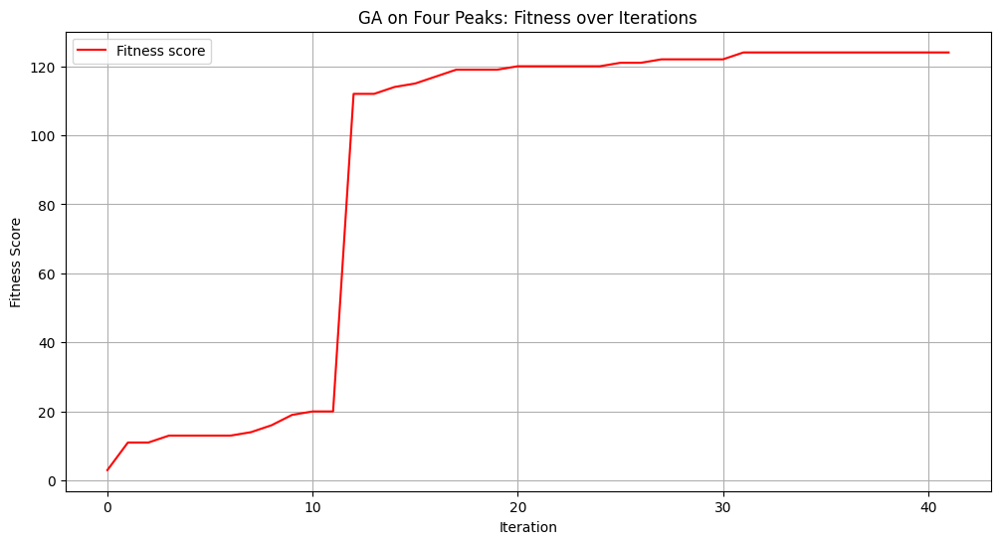

In [ ]:
# Plot the results in a graph
# Plot 1: Fitness Scores over Iterations
plt.figure(figsize=(12, 6))
plt.plot(ga_fp_curve['Iteration'], ga_fp_curve['Fitness'], label='Fitness score', color='r')
plt.title('GA on Four Peaks: Fitness over Iterations')
plt.xlabel('Iteration')
plt.ylabel('Fitness Score')
plt.legend()
plt.grid(True)
plt.show()

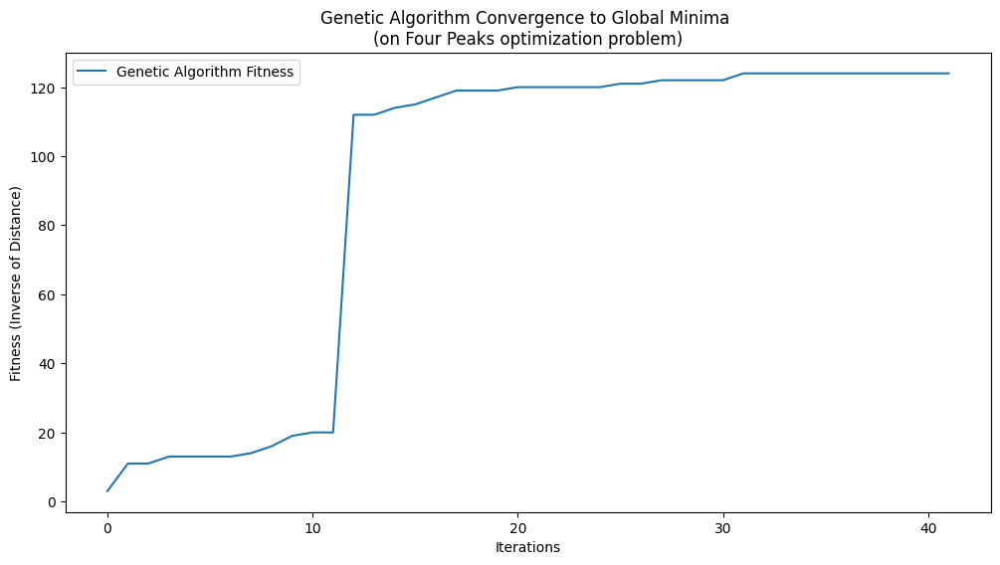

In [ ]:
# Plot the convergence to the global minima
plt.figure(figsize=(12, 6))
plt.plot(ga_fp_curve['Fitness'], label='Genetic Algorithm Fitness')
plt.title("Genetic Algorithm Convergence to Global Minima \n(on Four Peaks optimization problem)")
plt.xlabel("Iterations")
plt.ylabel("Fitness (Inverse of Distance)")
plt.legend()
plt.show()

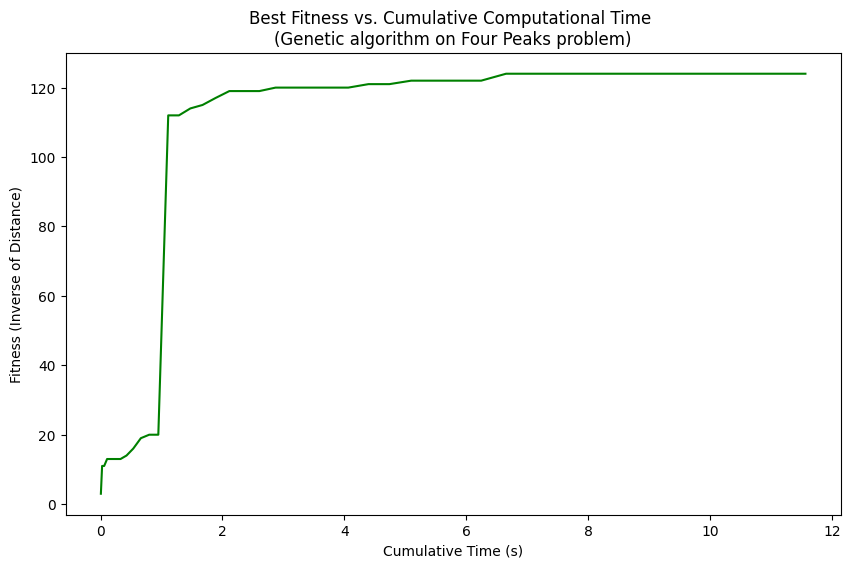

In [ ]:
# Accuracy vs. Fitness Time
# Tracking cumulative time
cumulative_time = np.cumsum(ga_fp_curve['Time'])
plt.figure(figsize=(10, 6))
plt.plot(cumulative_time, ga_fp_curve['Fitness'], color='green')
plt.title("Best Fitness vs. Cumulative Computational Time \n(Genetic algorithm on Four Peaks problem)")
plt.xlabel("Cumulative Time (s)")
plt.ylabel("Fitness (Inverse of Distance)")
plt.show()

<function matplotlib.pyplot.close(fig=None)>

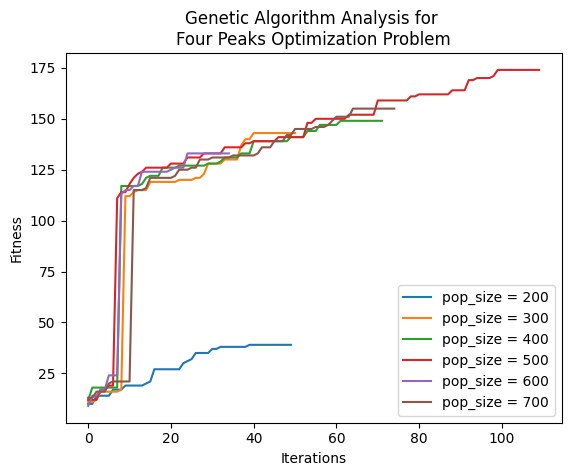

In [ ]:
# Set up the figure for plotting
plt.figure()

# Loop through population sizes from 200 to 700 in increments of 100
for population_size in range(200, 800, 100):
    # Run the genetic algorithm with the current population size
    _, _, ga_fitness_curve = genetic_alg(
        problem_fp,
        max_iters=iterations,  # Assuming 'iterations' is defined elsewhere
        random_state=2,
        pop_size=population_size,
        curve=True
    )

    # Plot the fitness curve for the current population size
    plt.plot(ga_fitness_curve[:, 0], label=f'pop_size = {population_size}')

# Configure plot titles and labels
plt.title('Genetic Algorithm Analysis for \nFour Peaks Optimization Problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')
plt.close

<function matplotlib.pyplot.close(fig=None)>

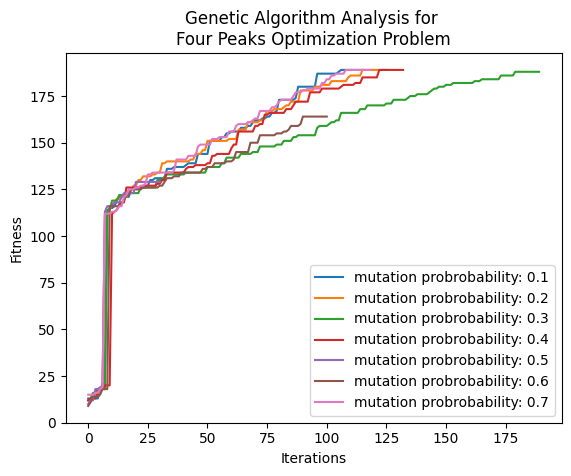

In [ ]:
probabilities = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]  # Define probabilities list for easier modification
plt.figure()

# Loop through each probability and plot the fitness curve
for prob in probabilities:
    _, _, ga_fitness_curve = genetic_alg(problem_fp, max_iters=iterations, pop_size=800, mutation_prob=prob, random_state=2, curve=True)
    plt.plot(ga_fitness_curve[:, 0], label=f'mutation probrobability: {prob}')

plt.title('Genetic Algorithm Analysis for \nFour Peaks Optimization Problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')
plt.close

### Solving the Four Peaks Problem Using the Simulated Annealing algorithm

In [ ]:
problem_length = 60
#init_state = np.random.randint(2, size = problem_length)
fitness = FourPeaks()
problem_fp = DiscreteOpt(length = problem_length, fitness_fn = fitness, maximize = True)

In [ ]:
start_time_for_GeomDecay = time.time()
_, best_fitness_for_GeomDecay, sa_fitness_curve1 = simulated_annealing(problem_fp, schedule = GeomDecay(), random_state = 10, max_iters = iterations, curve = True)
total_time_for_GeomDecay = time.time() - start_time_for_GeomDecay
print("Geometric Decay")
print("Best value for fitness: "+str(best_fitness_for_GeomDecay)+" Total time: "+str(total_time_for_GeomDecay))

start_time_for_ExpDecay = time.time()
_, best_fitness_for_ExpDecay, sa_fitness_curve2 = simulated_annealing(problem_fp, schedule = ExpDecay(),  random_state = 10, max_iters = iterations, curve = True)
total_time_for_ExpDecay = time.time() - start_time_for_ExpDecay
print("Exponential Decay")
print("Best value for fitness: "+str(best_fitness_for_ExpDecay)+" Total time: "+str(total_time_for_ExpDecay))

start_time_for_ArithDecay = time.time()
_, best_fitness_for_ArithDecay, sa_fitness_curve3 = simulated_annealing(problem_fp, schedule = ArithDecay(), random_state = 10, max_iters = iterations, curve = True)
total_time_for_ArithDecay = time.time() - start_time_for_ArithDecay
print("Arithmetic Decay")
print("Best value for fitness: "+str(best_fitness_for_ArithDecay)+" Total time: "+str(total_time_for_ArithDecay))


Geometric Decay
Best value for fitness: 98.0 Total time: 0.024399518966674805
Exponential Decay
Best value for fitness: 98.0 Total time: 0.024379968643188477
Arithmetic Decay
Best value for fitness: 88.0 Total time: 0.02750563621520996


<function matplotlib.pyplot.close(fig=None)>

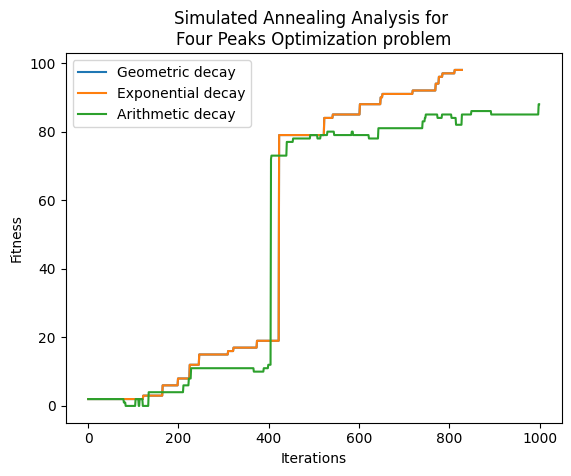

In [ ]:
plt.figure()
plt.plot(sa_fitness_curve1[:,0], label = 'Geometric decay')
plt.plot(sa_fitness_curve2[:,0], label = 'Exponential decay')
plt.plot(sa_fitness_curve3[:,0], label = 'Arithmetic decay')
plt.title('Simulated Annealing Analysis for \nFour Peaks Optimization problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')
plt.close

In [ ]:
# create a runner class and solve the problem
sa_fp_runner = SARunner(problem=problem_fp,
              experiment_name='four_peak_sa',
              output_directory=None, # note: specify an output directory to have results saved to disk
              seed=9,
              iteration_list=2 ** np.arange(11),
              max_attempts=95,
              #temperature_list=[0.1, 0.5, 2.0, 3.0, 4.5, 6.0],
              temperature_list=[0.1, 0.5, 0.75, 1.0, 2.0, 5.0],
              decay_list=[mlrose_hiive.GeomDecay,mlrose_hiive.ArithDecay,mlrose_hiive.ExpDecay])

# the two data frames will contain the results
#fp_sa_run_stats, fp_sa_run_curves = sa.run()

# Execute the simulation annealing algorithm
sa_fp_stats, sa_fp_curve = sa_fp_runner.run()

In [ ]:
# Disply the best state
#best_state = sa_fp_stats.loc[sa_fp_stats['Fitness'].idxmax()]['State']
#print("Best state:\n", best_state)

best_fitness = sa_fp_curve['Fitness'].max()
best_sa_fp_state = sa_fp_curve[sa_fp_curve['Fitness'] == best_fitness]
print("Best Fitness:\n", best_sa_fp_state)
#print("Best state:\n", best_sa_fp_state)

# best_state_index = sa_fp_stats['Fitness'].idxmax()
# best_state = sa_fp_stats.loc[best_state_index, 'State']
# print('Best state:', best_state)

Best Fitness:
       Iteration      Time  Fitness  FEvals Temperature  max_iters
8125        950  0.246183     92.0  1504.0        0.75       1024
8126        951  0.246590     92.0  1505.0        0.75       1024
8127        952  0.247007     92.0  1506.0        0.75       1024
8128        953  0.247441     92.0  1507.0        0.75       1024
8129        954  0.247848     92.0  1508.0        0.75       1024
...         ...       ...      ...     ...         ...        ...
8195       1020  0.276393     92.0  1602.0        0.75       1024
8196       1021  0.276827     92.0  1603.0        0.75       1024
8197       1022  0.277276     92.0  1604.0        0.75       1024
8198       1023  0.277712     92.0  1605.0        0.75       1024
8199       1024  0.278153     92.0  1606.0        0.75       1024

[75 rows x 6 columns]


In [ ]:
# Display the best fitness
best_fitness = sa_fp_stats['Fitness'].max()
print("Best fitness:", best_fitness)

Best fitness: 92.0


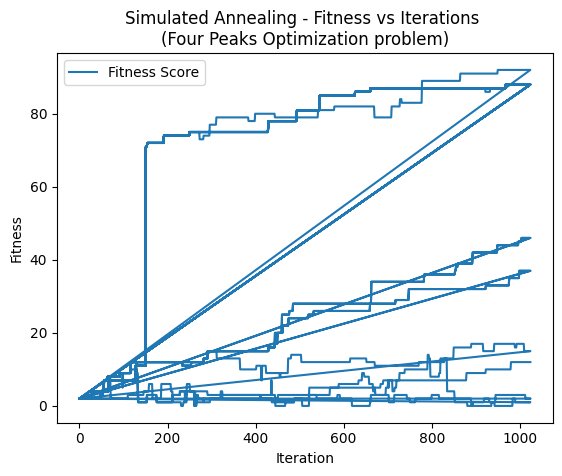

In [ ]:
# Plot the results in a graph - Fitness vs Iterations
plt.figure()
plt.plot(sa_fp_curve['Iteration'], sa_fp_curve['Fitness'], label='Fitness Score')
plt.title('Simulated Annealing - Fitness vs Iterations \n(Four Peaks Optimization problem)')
plt.xlabel('Iteration')
plt.ylabel('Fitness')
plt.legend()
plt.show()

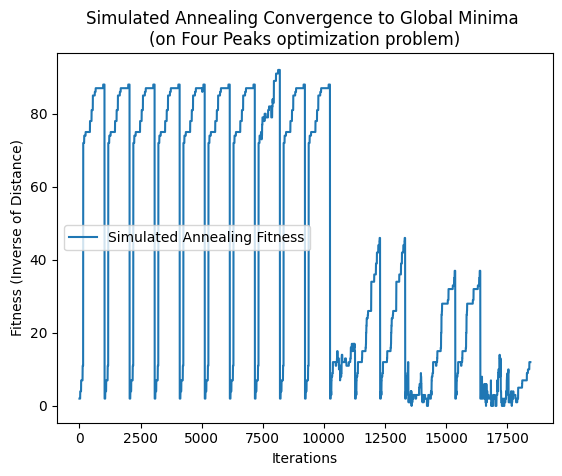

In [ ]:
# Plot the convergence to the global minima
plt.plot(sa_fp_curve['Fitness'], label='Simulated Annealing Fitness')
plt.title("Simulated Annealing Convergence to Global Minima \n(on Four Peaks optimization problem)")
plt.xlabel("Iterations")
plt.ylabel("Fitness (Inverse of Distance)")
plt.legend()
plt.show()

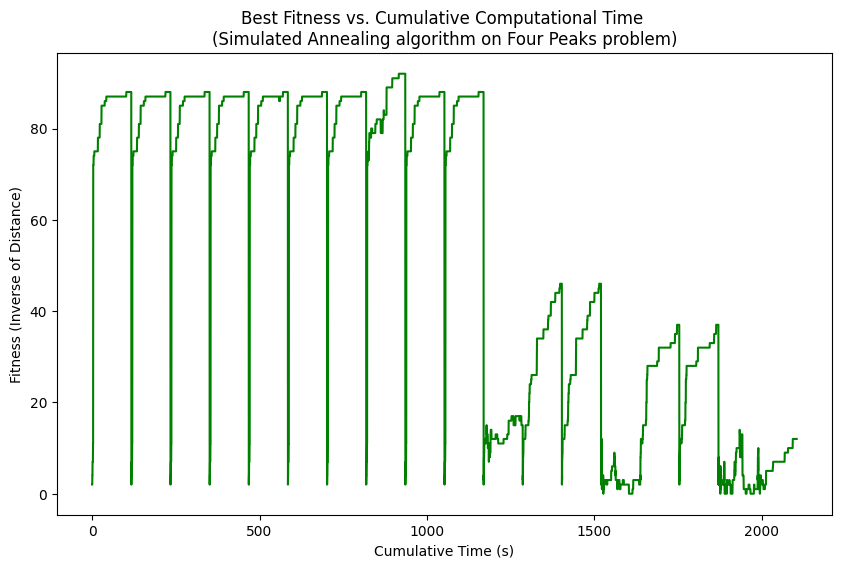

In [ ]:
# Accuracy vs. Fitness Time
# Tracking cumulative time
cumulative_time = np.cumsum(sa_fp_curve['Time'])
plt.figure(figsize=(10, 6))
plt.plot(cumulative_time, sa_fp_curve['Fitness'], color='green')
plt.title("Best Fitness vs. Cumulative Computational Time \n(Simulated Annealing algorithm on Four Peaks problem)")
plt.xlabel("Cumulative Time (s)")
plt.ylabel("Fitness (Inverse of Distance)")
plt.show()

### Solving the Four Peaks Problem Using the Randomized Hill Climbing algorithm

In [ ]:
problem_length = 60
fitness = FourPeaks(t_pct=0.1)
problem_length = 100  # You can adjust this value as needed
problem_fp = DiscreteOpt(length = problem_length, fitness_fn = fitness, maximize = True)

In [ ]:
# create a runner class and solve the problem
rhc_fp_runner = RHCRunner(problem=problem_fp,
                   experiment_name="RHC_Four_Peaks",
                   output_directory=None,  # Specify your output directory here
                   seed=9,
                   iteration_list=2 ** np.arange(8),
                   max_attempts=500,
                   restart_list=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20])

# Run the RHC algorithm
rhc_fp_stats, rhc_fp_curve = rhc_fp_runner.run()

In [ ]:
# Display the best state
best_state = rhc_fp_stats.loc[rhc_fp_stats['Fitness'].idxmax()]['State']
print("Best State:", best_state)

Best State: [1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [ ]:
# Display the best fitness
best_fitness = rhc_fp_stats['Fitness'].max()
print("Best Fitness:", best_fitness)

Best Fitness: 16.0


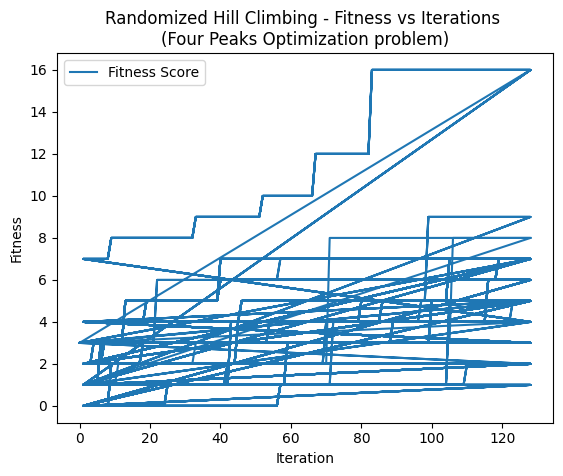

In [ ]:
# Plot the results in a graph - Fitness vs Iterations
plt.figure()
plt.plot(rhc_fp_curve['Iteration'], rhc_fp_curve['Fitness'], label='Fitness Score')
plt.title('Randomized Hill Climbing - Fitness vs Iterations \n(Four Peaks Optimization problem)')
plt.xlabel('Iteration')
plt.ylabel('Fitness')
plt.legend()
plt.show()

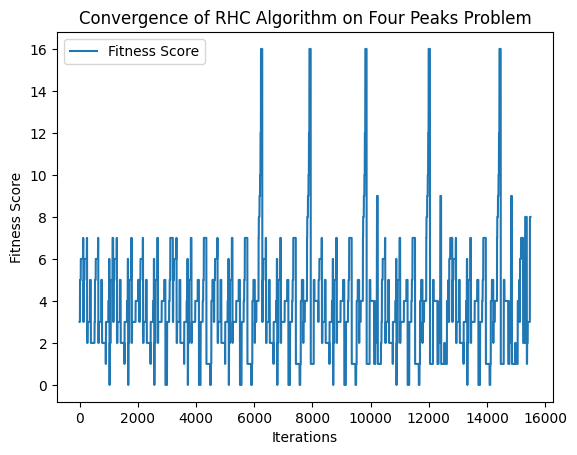

In [ ]:
# Plot the convergence of the RHC algorithm
plt.figure()
plt.plot(rhc_fp_curve['Fitness'], label='Fitness Score')
plt.title('Convergence of RHC Algorithm on Four Peaks Problem')
plt.xlabel('Iterations')
plt.ylabel('Fitness Score')
plt.legend()
plt.show()


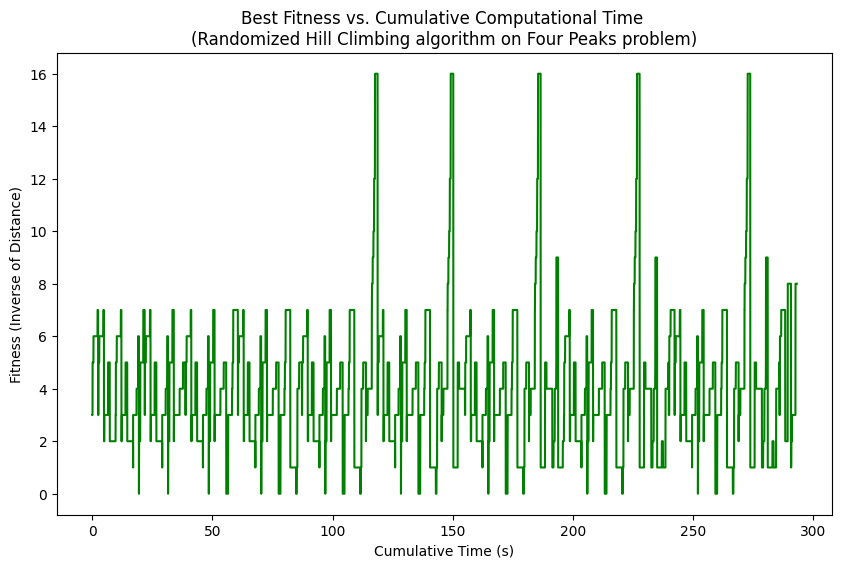

In [ ]:
# Accuracy vs. Fitness Time
# Tracking cumulative time
cumulative_time = np.cumsum(rhc_fp_curve['Time'])
plt.figure(figsize=(10, 6))
plt.plot(cumulative_time, rhc_fp_curve['Fitness'], color='green')
plt.title("Best Fitness vs. Cumulative Computational Time \n(Randomized Hill Climbing algorithm on Four Peaks problem)")
plt.xlabel("Cumulative Time (s)")
plt.ylabel("Fitness (Inverse of Distance)")
plt.show()

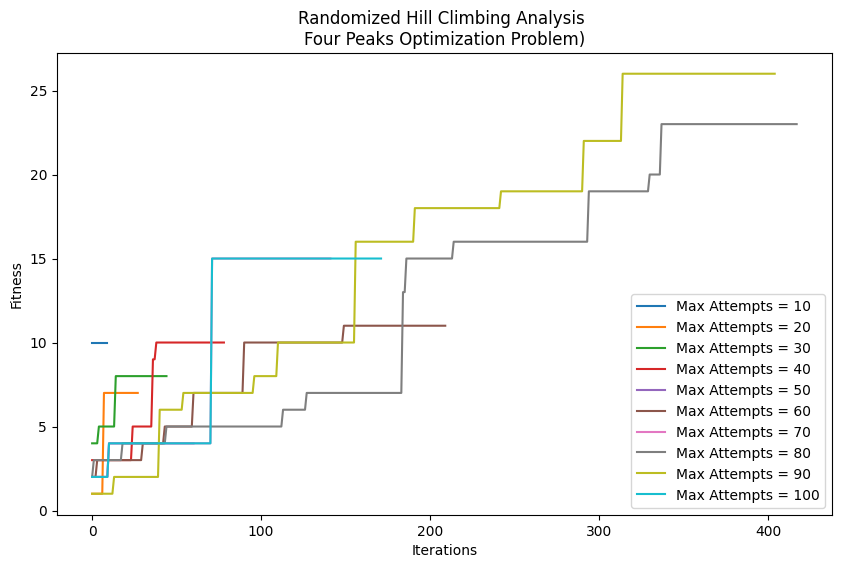

In [ ]:
def plot_rhc_analysis(problem, iterations, start=10, stop=110, step=10, restarts=10, random_state=2):
    plt.figure(figsize=(10, 6))

    # Loop through the specified range of maximum attempts
    for attempts in range(start, stop, step):
        # Perform Randomized Hill Climbing with the relevant parameters
        _, _, rhc_fitness_curve = random_hill_climb(
            problem_fp,
            restarts=restarts,
            max_iters=iterations,
            random_state=random_state,
            max_attempts=attempts,
            curve=True
        )

        # Plot the fitness curve
        plt.plot(rhc_fitness_curve[:, 0], label=f'Max Attempts = {attempts}')

    # Set plot titles and labels
    plt.title('Randomized Hill Climbing Analysis \nFour Peaks Optimization Problem)')
    plt.legend()
    plt.xlabel('Iterations')
    plt.ylabel('Fitness')

    # Close the plot to prevent it from displaying automatically
    plt.show()

# Assuming 'problem' and 'iterations' variables are defined elsewhere in your code
plot_rhc_analysis(problem_fp, iterations)

<function matplotlib.pyplot.close(fig=None)>

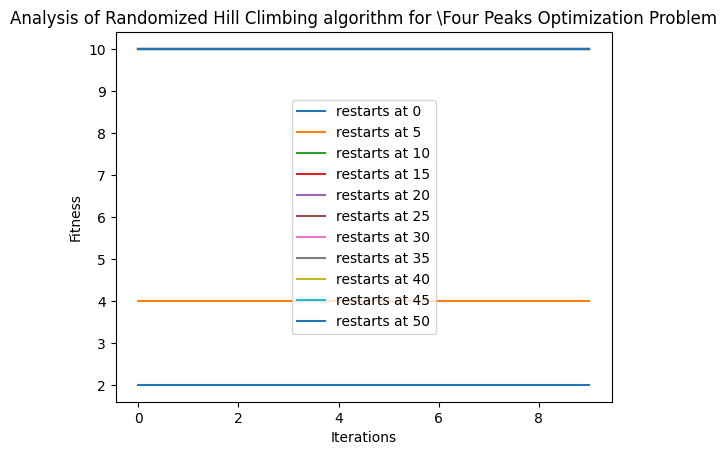

In [ ]:
plt.figure()
for restart in range(0,51,5):
    _, _, fitness_curve_rhc_fp = random_hill_climb(problem_fp, restarts = restart, random_state = 2, max_iters = iterations, curve = True)

    plt.plot(fitness_curve_rhc_fp[:,0], label = f'restarts at {restart}')
plt.title('Analysis of Randomized Hill Climbing algorithm for \Four Peaks Optimization Problem')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fitness')
plt.close

### Solving the Four Peaks Problem Using the MIMIC algorithm

In [ ]:
problem_length = 60
fitness = FourPeaks(t_pct=0.1)
problem_length = 100  # You can adjust this value as needed
problem_fp = DiscreteOpt(length = problem_length, fitness_fn = fitness, maximize = True)

In [ ]:
# Create a runner class and solve the problem using MIMIC

mimic_fp_runner = MIMICRunner(problem=problem_fp,
                           experiment_name="Four_Peaks_MIMIC",
                           output_directory=None,
                           seed=9,
                           iteration_list=2 ** np.arange(12),
                           max_attempts=100,
                           # population_sizes=[200, 300, 400, 500, 600, 700, 800, 900],
                           population_sizes=[200, 300, 400, 500, 600, 700, 800],
                           keep_percent_list=[0.1, 0.2, 0.3, 0.4, 0.5],
                           use_fast_mimic=True)

# Run the MIMIC algorithm
mimic_fp_stats, mimic_fp_curve = mimic_fp_runner.run()

In [ ]:
# Display the best state
best_state = mimic_fp_stats.loc[mimic_fp_stats['Fitness'].idxmax()]['State']
print(f"Best State:\n{best_state}")

Best State:
[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


In [ ]:
# Display the best fitness
best_fitness = mimic_fp_stats['Fitness'].max()
print(f"Best Fitness: {best_fitness}")

Best Fitness: 149.0


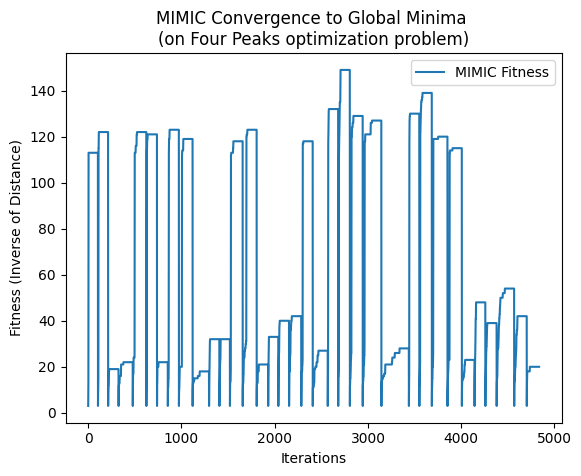

In [ ]:
# Plot the convergence to the global minima
plt.plot(mimic_fp_curve['Fitness'], label='MIMIC Fitness')
plt.title("MIMIC Convergence to Global Minima \n(on Four Peaks optimization problem)")
plt.xlabel("Iterations")
plt.ylabel("Fitness (Inverse of Distance)")
plt.legend()
plt.show()

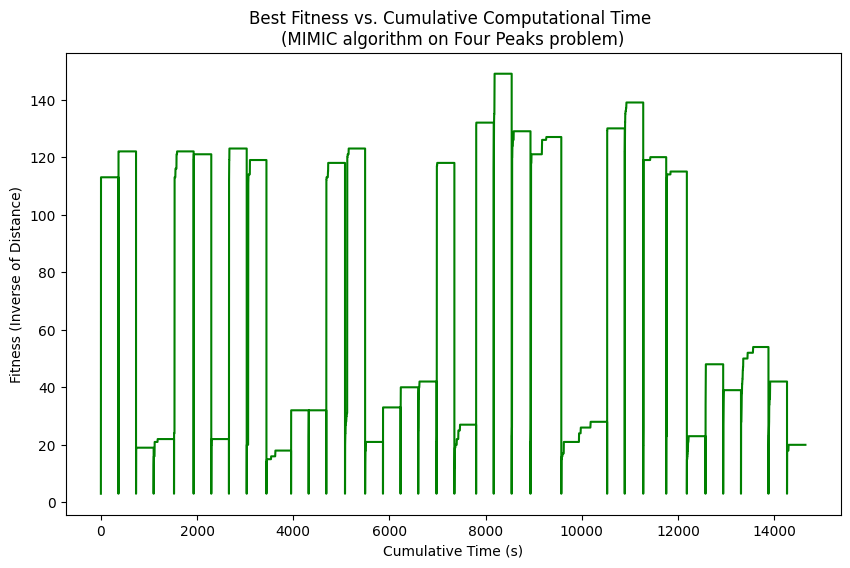

In [ ]:
# Accuracy vs. Fitness Time
# Tracking cumulative time
cumulative_time = np.cumsum(mimic_fp_curve['Time'])
plt.figure(figsize=(10, 6))
plt.plot(cumulative_time, mimic_fp_curve['Fitness'], color='green')
plt.title("Best Fitness vs. Cumulative Computational Time \n(MIMIC algorithm on Four Peaks problem)")
plt.xlabel("Cumulative Time (s)")
plt.ylabel("Fitness (Inverse of Distance)")
plt.show()

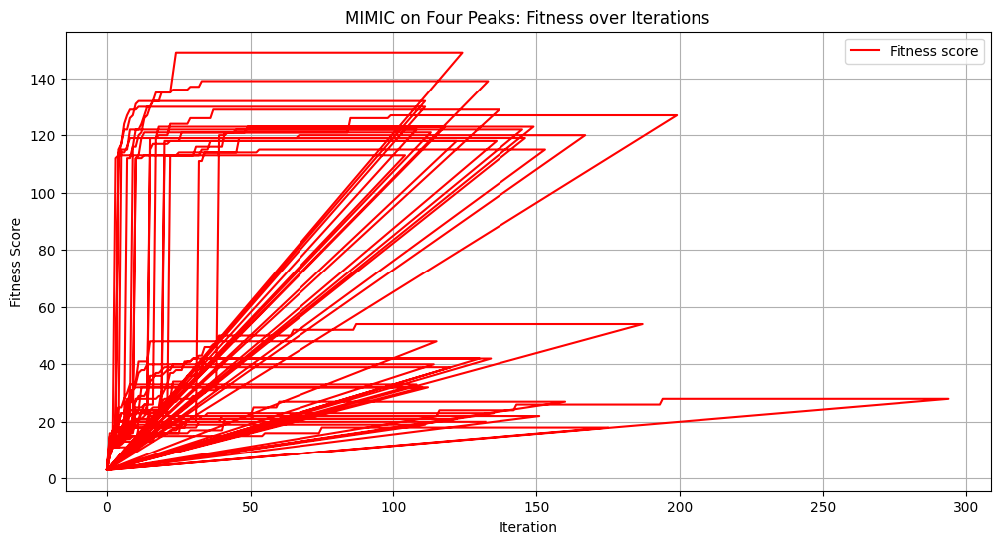

In [ ]:
# Plot the results in a graph
# Plot: Fitness Scores over Iterations
plt.figure(figsize=(12, 6))
plt.plot(mimic_fp_curve['Iteration'], mimic_fp_curve['Fitness'], label='Fitness score', color='r')
plt.title('MIMIC on Four Peaks: Fitness over Iterations')
plt.xlabel('Iteration')
plt.ylabel('Fitness Score')
plt.legend()
plt.grid(True)
plt.show()

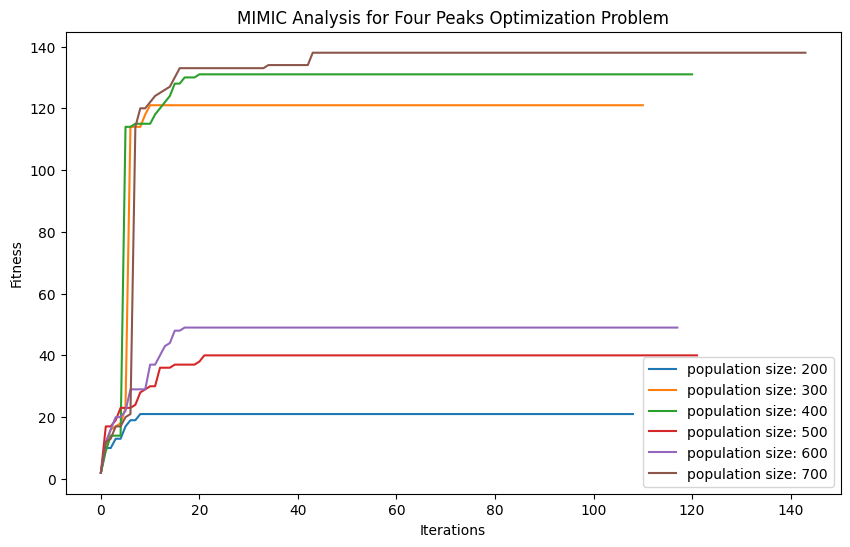

In [ ]:
problem_fp = DiscreteOpt(length = problem_length, fitness_fn = fitness, maximize = True)
iterations = 1000

plt.figure(figsize=(10, 6))
plt.title('MIMIC Analysis for Four Peaks Optimization Problem')
plt.xlabel('Iterations')
plt.ylabel('Fitness')

# Enable fast mode for the problem (assuming this method exists for your problem instance)
problem_fp.set_mimic_fast_mode(True)

# Generate and plot fitness curves for various population sizes
for pop_size in range(200, 800, 100):
    # Setup MIMICRunner with the current population size
    fp_mimic_runner = MIMICRunner(problem=problem_fp,
                               experiment_name='MIMIC_FP',
                               output_directory=None,  # Specify your output directory
                               seed=2,
                               iteration_list=2**np.arange(11),
                               max_attempts=100,
                               population_sizes=[pop_size],
                               keep_percent_list=[0.2],  # Example keep percent, adjust as needed
                               use_fast_mimic=True)

    # Run MIMIC with the current population size
    df_fp_mimic_run_stats, df_fp_mimic_run_curves = fp_mimic_runner.run()

    # Filter the DataFrame for the current population size
    df_filtered = df_fp_mimic_run_curves[(df_fp_mimic_run_curves['Population Size'] == pop_size) & (df_fp_mimic_run_curves['Keep Percent'] == 0.2)]

    # Sort by Iteration to ensure the curve is plotted correctly
    df_filtered = df_filtered.sort_values('Iteration')

    # Plot the fitness curve for the current population size
    plt.plot(df_filtered['Iteration'], df_filtered['Fitness'], label=f'population size: {pop_size}')

# Finalize and show the plot
plt.legend()
plt.show()